# The second part of the assignment, IDS 2021-2022
In this Jupyter notebook document all your results and the way you have obtained them. Please use the _Python environment_ provided for this part of the assignment. In addition to the _Jupyter notebook_, please submit _one zip-file_ containing  other outputs you have generated that are not included in this notebook (such as pdf, jpg, and others). Please make sure that the other outputs are easily identifiable, i.e. use names as requested in the corresponding question. _You do not need to include the datasets._

This is the _only_ submission that is required (Jupyter notebook + zip-file). A separate report is _not_ needed and will not be considered for grading. 

Give your commented Python code and answers in the corresponding provided cells. Make sure to answer all questions in a clear and explicit manner and discuss your outputs. _Please do not change the general structure of this notebook_. You can, however, add additional markdown or code cells if necessary. <b>Please DO NOT CLEAR THE OUTPUT of the notebook you are submitting! </b>

<font color="red"> Please make sure to include the names and matriculation numbers of all group members in the slot provided below. </font> If a name or a student id is missing, the student will not receive any points.

<font color="red">Plan your time wisely. </font> A few parts of this assignment might take some time to run. It might be necessary to consider time management when you plan your group work.

Hint: RWTHmoodle allows multiple submissions, with every new submission overwriting the previous one. <b>Partial submissions are therefore possible and encouraged. </b> This might be helpful in case of technical issues with RWTHMoodle, which may occur close to the deadline.


<font color="red"><b>Student Names and IDs:
    
    1.  Joshua Weinbrenner 383400

    2.  Jonas Philipps 377818

# Setup

In [1]:
### Display
from IPython.core.display import display, HTML

### Widgets
#import ipywidgets as widgets

### Data Handline
import pandas as pd
import numpy as np

### Utility
import math
import string
import datetime
import pickle

### Plotting
# Matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import cm
# Matplotlib toolkits
from mpl_toolkits.axes_grid1 import make_axes_locatable
# Seaborn
import seaborn as sns
# Plotly
import plotly.graph_objects as go
# Gespatial data with cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature

### Sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import SGDClassifier
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split


### Frequent Pattern Mining
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import fpgrowth
from mlxtend.frequent_patterns import association_rules as arule

### Text Mining
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize
from nltk.stem.snowball import SnowballStemmer
from nltk.stem import WordNetLemmatizer
from nltk.lm.preprocessing import padded_everygram_pipeline
from nltk.lm import MLE
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

### PM4Py
import pm4py
# Log Handling
from pm4py.objects.conversion.log import converter as log_converter
# Statistics
from pm4py.statistics.traces.generic.log import case_statistics
# Filtering
from pm4py.algo.filtering.log.variants import variants_filter
from pm4py.algo.filtering.log.attributes import attributes_filter
# Discovery and Conformance Checking
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator
from pm4py.objects.conversion.process_tree import converter as pt_converter
# Visualization
from pm4py.visualization.process_tree import visualizer as pt_visualizer
from pm4py.visualization.petri_net import visualizer as pn_visualizer

/opt/anaconda3/envs/env-IDS2021-assignment-2/lib/python3.8/site-packages/gensim/similarities/__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [2]:
# Pandas indexing
idx = pd.IndexSlice

Be careful if you use the **matplotlib widget** magic. If you do not close the created plots, previous plots may change if you create a new one.
So if you use this magic command, be careful about your outputs in your final submission.

In [3]:
%matplotlib inline

# Q1 - Preprocessing (20 points)
In this question, we consider a US-census dataset (**census_data.csv**).
Each row contains statistics of a certain tract on a variety of, particularly income- and work-related, life aspects of US citizens.
Short column description:

| Column | Description |
| ------ | ----------- |
| CensusTract | Tract |
| State | State |
| County | County |
| TotalPop | Total population  |
| Men | Number of men |
| Women | Number of women |
| Hispanic, White, Black, Native, Asian, Pacific | Percentage of ethnic group |
| Citizen | Percentage of citizen |
| Income | Median household income |
| IncomePerCap | Income per capita |
| Poverty | Poverty rate |
| ChildPoverty | Child poverty rate |
| Professional | Employed in management, business, science, and arts (percentage) |
| Service, Office, Construction, Production | Other profession fields (percentage) |
| PrivateWork, PublicWork | Employed in private / public sector (percentage) |
| Drive, Carpool, Transit, Walk, OtherTransp | Means of commuting (percentage) |
| WorkAtHome | Working at home (percentage) |
| MeanCommute | Mean time for commuting |
| Employed | Number of employed |
| SelfEmployed | Self-employed (percentage) |
| FamilyWork | Unpaid family work (percentage) |
| Unemployment | Unemployment rate |


## Loading the Data and Initial Quality Investigation

**a)** Load the dataset into a dataframe `df`. <font color='red'>Use the CensusTract as index for your dataframe</font>. In doing so, ensure that the index is valid, that is, it does not contain any duplicate entries.

**In the subsequent questions, only modify the dataframe `df` if explicitly requested. However, you can always create working copies.**

In the first 3 questions, answers are given in <font color='blue'>blue</font> and remarks in *italic*.

In [4]:
# load csv dataset into pandas dataframe
df = pd.read_csv('dataset/census_data.csv')

# use CensusTract as index
df = df.set_index('CensusTract')

# check if there are any duplicates in the CensusTract column (i.e. the index of the dataframe)
df.index.duplicated().nonzero()

(array([], dtype=int64),)

<font color='blue'>
We have loaded the dataset in the dataframe df. There are no duplicates in the CensusTract, which is set as the index of df.
</font>

**b)** Show the data types of the dataframe columns as well as the first few rows. On the first sight, are there any data type problems (e.g., numerical columns having a non-numerical data type)? 

In [5]:
# show the data types of the df columns
df.dtypes

State            object
County           object
TotalPop          int64
Men             float64
Women           float64
Hispanic        float64
White           float64
Black           float64
Native          float64
Asian           float64
Pacific         float64
Citizen           int64
Income          float64
IncomePerCap    float64
Poverty         float64
ChildPoverty    float64
Professional    float64
Service         float64
Office          float64
Construction    float64
Production      float64
Drive           float64
Carpool         float64
Transit         float64
Walk            float64
OtherTransp     float64
WorkAtHome      float64
MeanCommute     float64
Employed          int64
PrivateWork     float64
PublicWork      float64
SelfEmployed    float64
FamilyWork      float64
Unemployment    float64
dtype: object

In [6]:
# show first few rows of the df
df.head().transpose()

CensusTract,1001020100,1001020200,1001020300,1001020400,1001020500
State,Alabama,Alabama,Alabama,Alabama,Alabama
County,Autauga,Autauga,Autauga,Autauga,Autauga
TotalPop,1948,2156,2968,4423,10763
Men,940.0,1059.0,1364.0,2172.0,4922.0
Women,1008.0,1097.0,1604.0,2251.0,5841.0
Hispanic,0.9,0.8,0.0,10.5,0.7
White,87.4,40.4,74.5,82.8,68.5
Black,7.7,53.3,18.6,3.7,24.8
Native,0.3,0.0,0.5,1.6,0.0
Asian,0.6,2.3,1.4,0.0,3.8


<font color='blue'>
On the first sight, there seem to be no data type problems. All numerical columns are having a non-numerical data type. The textual columns ("State" and "County") are having the data type "object", which is one of the possible ways to store text data in pandas (the other is "StringDtype").
</font> 

*Remark: Pandas user guide on textual data [here](https://pandas.pydata.org/pandas-docs/stable/user_guide/text.html) and interesting TDS article on whether to use object or StringDtype [here](https://towardsdatascience.com/why-we-need-to-use-pandas-new-string-dtype-instead-of-object-for-textual-data-6fd419842e24).*

**c)** To improve performance and memory usage (in particular for large datasets) it is important to use **categorical** columns whenever suitable. 
Are there any categorical column candidates? Explain your answer. \
Afterwards, convert these columns into categorical columns.

<font color='blue'>
The columns "State" and "County" are candidates for being converted into categorical columns, as the possible unique values are limited to the 50 states resp. 3006 counties of the US.

In [7]:
# copy the df to be able to compare it to the converted df later
df_prev = df.copy()

# convert the "State" and "County" columns to categorical
df['State'] = pd.Categorical(df.State)
df['County'] = pd.Categorical(df.County)

# see how much memory is saved due to the conversion
print("State prev: ", df_prev.memory_usage().State)
print("State now: ", df.memory_usage().State)
print("State diff: ", df_prev.memory_usage().State - df.memory_usage().State)

print("County prev: ", df_prev.memory_usage().County)
print("County now: ", df.memory_usage().County)
print("County diff: ", df_prev.memory_usage().County - df.memory_usage().County)

State prev:  592008
State now:  76521
State diff:  515487
County prev:  592008
County now:  229514
County diff:  362494


<font color='blue'>
The conversion of "State" and "County" into categorical columns saved 515,487 bytes of memory usage for the "State" column and 362,494 bytes of memory usage for the "County" column.
</font>

**d)** To select a good strategy to deal with missing data, it is important to get an overview over the general data distribution.
Show the basic statistics for the dataset and create 6 boxplots for the following column groupings:

    ['TotalPop', 'Men', 'Women', 'Citizen', 'Employed'],
    ['Income', 'IncomePerCap'],
    ['Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific'],
    ['PrivateWork', 'PublicWork', 'SelfEmployed', 'FamilyWork', 'Unemployment', 'Poverty', 'ChildPoverty'],
    ['Professional', 'Service', 'Office', 'Construction', 'Production', 'Drive', 'Carpool', 'Transit', 'Walk', 'OtherTransp', 'WorkAtHome'],
    ['MeanCommute']

Can you spot any (severe) data quality problems, in particular, are there unrealistic values (also considering the semantics)?

*Hint: Use the `df.describe()` function.*

In [8]:
# show basic statistics of the df
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
TotalPop,74001.0,4325.591465,2129.306903,0.0,2891.0,4063.0,5442.000,53812.0
Men,73622.0,2127.937437,1072.200320,0.0,1409.0,1987.0,2674.000,27962.0
Women,73640.0,2197.755337,1095.899964,0.0,1460.0,2066.0,2774.000,27250.0
Hispanic,73311.0,16.862810,22.940695,0.0,2.4,7.0,20.400,100.0
White,73311.0,62.032106,30.684152,0.0,39.4,71.4,88.300,100.0
Black,73311.0,13.272581,21.762483,0.0,0.7,3.7,14.400,100.0
Native,73311.0,0.727726,4.488340,0.0,0.0,0.0,0.400,100.0
Asian,73311.0,4.588253,8.794003,0.0,0.2,1.4,4.800,91.3
Pacific,73311.0,0.145012,1.037354,0.0,0.0,0.0,0.000,84.7
Citizen,74001.0,3043.079566,1475.492946,0.0,2037.0,2863.0,3838.000,37416.0


<font color='blue'>
+ All procentual columns have a min of not less than 0 and a max of not more than 100 <br>
- The count of all other columns is less then that of TotalPop resp. Employed -> many missing values in these columns (a deeper analysis of missing values will follow) <br>
- A TotalPop of 0 looks weird, let us have a deeper look into these rows

In [9]:
df.loc[df.TotalPop == 0].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
TotalPop,690.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Men,690.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Women,690.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Hispanic,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
White,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Black,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Native,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Asian,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Pacific,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Citizen,690.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<font color='blue'>
690 counties either have really a population of 0 or a "census officer" that doesn't take his job seriously. However, in these counties there is still a value of 0 given for the columns "Men", "Women", "Citizen" and "Employed", while all other columns where not filled at all (resp. with NaNs).

<AxesSubplot:>

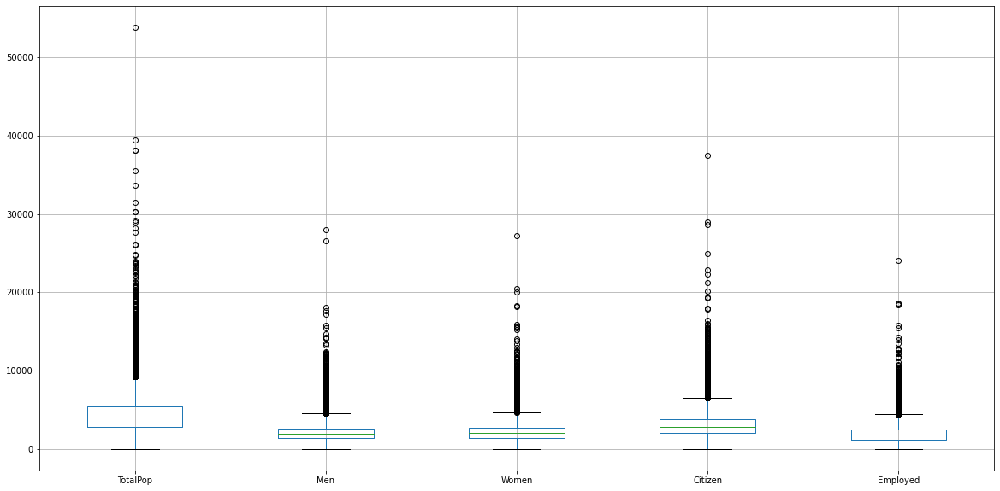

In [10]:
df[['TotalPop', 'Men', 'Women', 'Citizen', 'Employed']].boxplot(figsize=(20,10))

<font color='blue'>
There are many high outliers and some really high outliers -> the majority of tracts have a rather small population but there are some (really) big ones, which are most likely from the major coastal cities of the US

<AxesSubplot:>

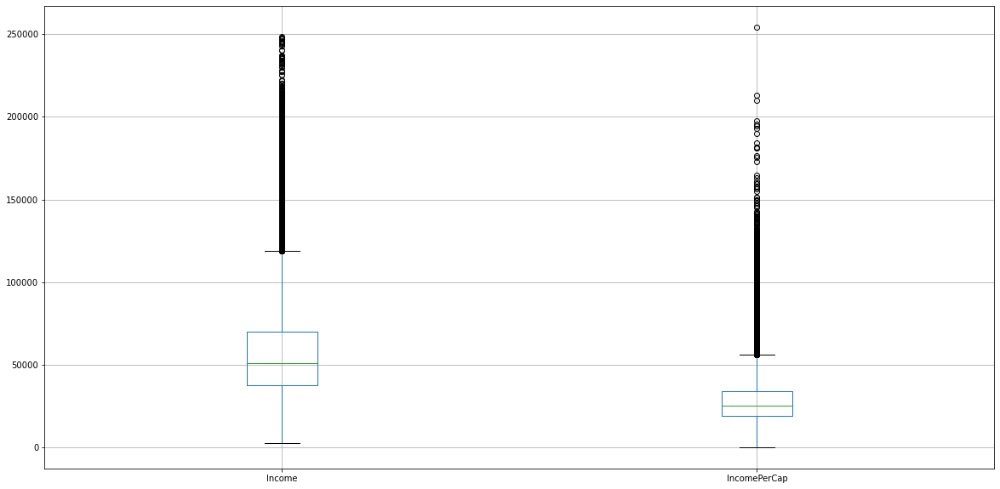

In [11]:
df[['Income', 'IncomePerCap']].boxplot(figsize=(20,10))

<font color='blue'>
Also high outliers when we are looking at the income -> The gap between (super-)rich and poor (majority) is clearly visible

<AxesSubplot:>

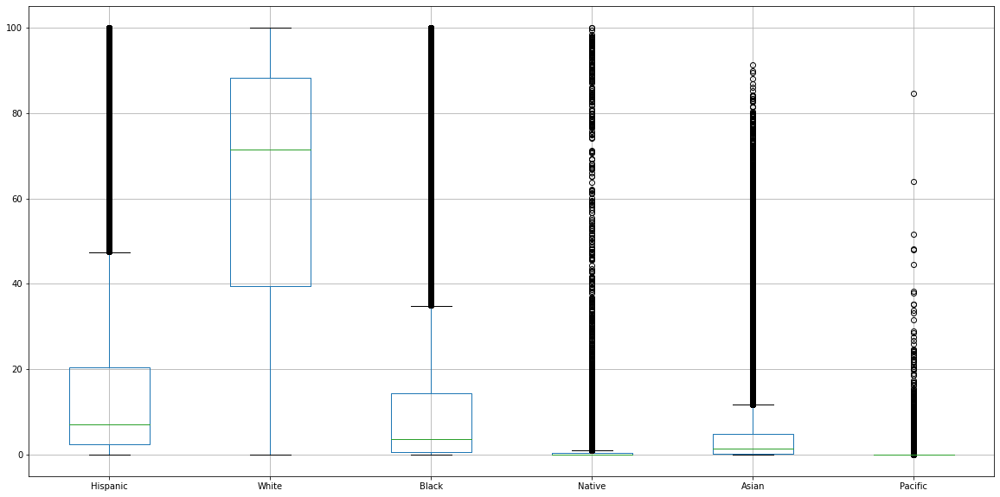

In [12]:
df[['Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific']].boxplot(figsize=(20,10))

<font color='blue'>
The majority of the US is white and there are many "minority x only" tracts/neighbor"hoods"/communities (racial segregation) -> these plots look like excpected

<AxesSubplot:>

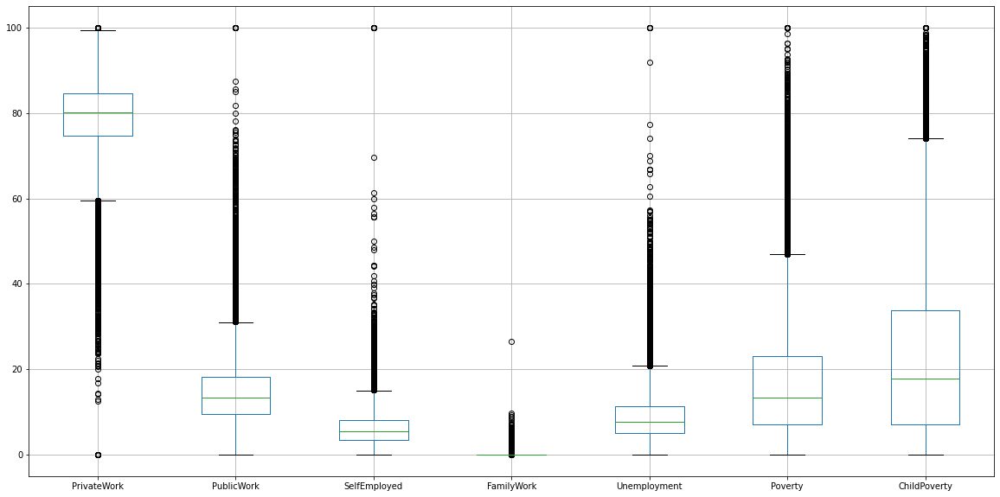

In [13]:
df[['PrivateWork', 'PublicWork', 'SelfEmployed', 'FamilyWork', 'Unemployment', 'Poverty', 'ChildPoverty']].boxplot(figsize=(20,10))

<font color='blue'>
Most people work in private work, less in public work and the fewest are self employed. "Oficially" almost nobody is doing family work.
The unemployment lookes realistic, while it would be interesting what tracts have a unemployment rate of 100% (maybe self-sufficient Indian reservations, where no one has an "official" job?).

<AxesSubplot:>

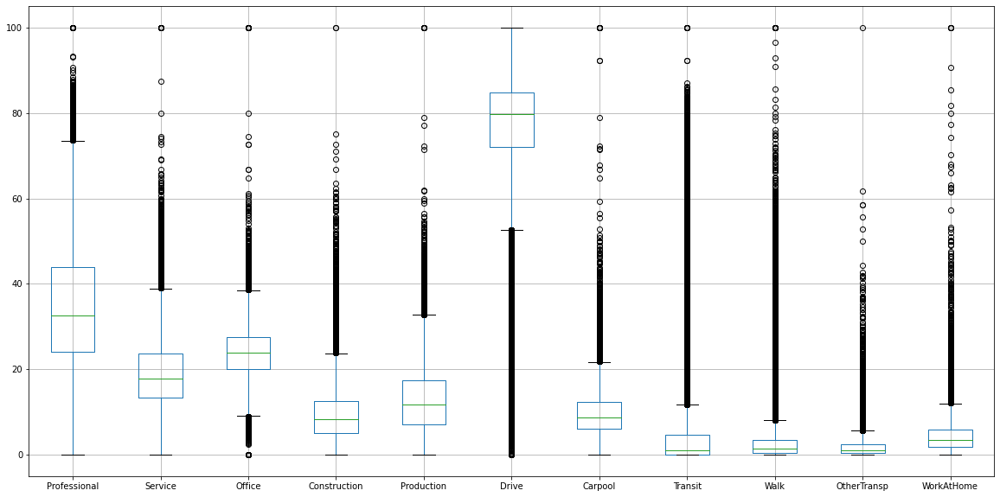

In [14]:
df[['Professional', 'Service', 'Office', 'Construction', 'Production', 'Drive', 'Carpool', 'Transit', 'Walk', 'OtherTransp', 'WorkAtHome']].boxplot(figsize=(20,10))

<font color='blue'>
All this looks realistic and like what we would have excpected. It would be interesting to see which tracts are the ones with the specific rates at 100%.

<AxesSubplot:>

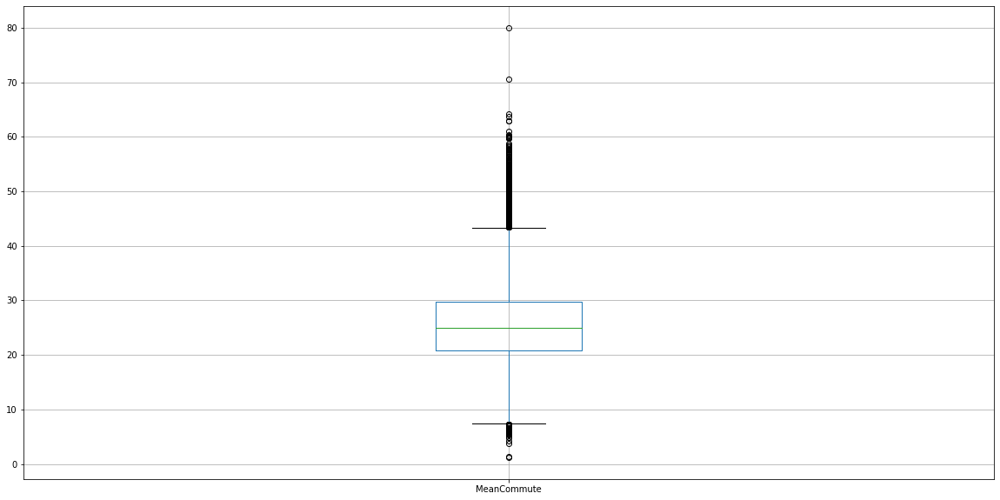

In [15]:
df[['MeanCommute']].boxplot(figsize=(20,10))

## Handling Missing Values
(In the following task you can assume that every NAN entry in the dataframe is actually a missing value. This can paritally be justified by the fact that pandas did not have problems inferring the "proper" datatypes (e.g., numbers types as string would result in an object column) and your subsequent check of the data types. Therefore, you can use `df.isna()` as a proxy indicator for missing values.)

**e)** Simply filling missing entries is usually not a good idea. Therefore, you should first analyze the quantity of missing values and check for patterns of missing values.

To this end, compute the following statistics on missing values:
1) How many entries does the dataframe have? (To relate this to the number of entries missing)
2) How many missing values do we have?
3) How many rows have at least a single missing value?
4) Count the number of missing values per column.
5) Count the number of missing values per row and aggregate them - i.e., show the number of rows that suffer from x missing values.

What do you observe?

<font color='blue'>
1) How many entries does the dataframe have? (To relate this to the number of entries missing)

In [16]:
# number of elements in df
print("shape: ", df.shape)
print("size: ", df.size)

shape:  (74001, 34)
size:  2516034


<font color='blue'>
2) How many missing values do we have?

In [17]:
# number of missing values in df
print("missing values: ", df.isna().sum().sum())

missing values:  22469


<font color='blue'>
3) How many rows have at least a single missing value?

In [18]:
# number of rows that have at least one missing value
print("rows with min. 1 missing values: ", df.isna().any(axis=1).sum())

rows with min. 1 missing values:  2008


<font color='blue'>
4) Count the number of missing values per column.

In [19]:
# number missing values per column
print("column   |  # missing values")
df.isna().sum()

column   |  # missing values


State              0
County             0
TotalPop           0
Men              379
Women            361
Hispanic         690
White            690
Black            690
Native           690
Asian            690
Pacific          690
Citizen            0
Income          1100
IncomePerCap     740
Poverty          835
ChildPoverty    1118
Professional     807
Service          807
Office           807
Construction     807
Production       807
Drive            797
Carpool          797
Transit          797
Walk             797
OtherTransp      797
WorkAtHome       797
MeanCommute      949
Employed           0
PrivateWork      807
PublicWork       807
SelfEmployed     807
FamilyWork       807
Unemployment     802
dtype: int64

<AxesSubplot:>

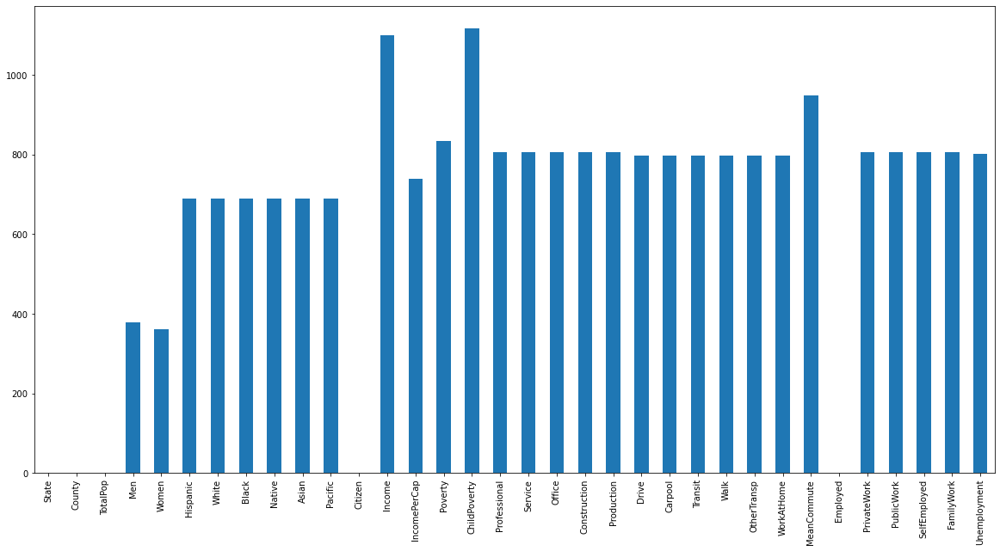

In [20]:
df.isna().sum().plot.bar(figsize=(20,10))

<font color='blue'>
5) Count the number of missing values per row and aggregate them - i.e., show the number of rows that suffer from x missing values

In [21]:
# number of missing values per row aggregated
print("mis. val. | #rows")
df.isna().sum(axis=1).value_counts()

mis. val. | #rows


0     71993
1       982
27      690
3        93
2        91
20       90
4        32
13        8
19        7
18        4
21        4
5         2
14        2
9         1
16        1
12        1
dtype: int64

<font color='blue'>
Discussion: <br>
- 1) & 2) From a total of 2516034 values, 22469 are missing. That is 0.893 %. <br>
- 3) 2008 rows have at least 1 missing value ??? <br>
- 4) We see some plateus ih the missing values per column. As we have seen in the beginning, there are 690 tracts with appeareantly 0 population. In addition there seem to be 807 - 690 = 117 tracts that have a population > 0 but do not track any employment data. 797 - 690 = 107 tracts don't seem to track work related data (employment and commute) at all. <br>
- 5) Most rows don't have missing values at all. On second place there are rows with 1 missing value. On place 3 we have the 690 tracts which are missing 27 values (these must be te tracts without a population that we have already discussed above).<br>

**f)** We decide to **remove all rows from `df` where the total population is zero**. \
Given the preceding results, how do you evaluate this strategy? Try to motivate your argumentation by additional short analysis results (see hint for an inspiration).

*Hint: It might be interesting to have a look at the rows with zero population. Afterwards, you can provide some analysis results that show that your (potential) observation generalizes to all rows with zero population.*

<font color='blue'>
We have already taken a look at this data points and discussed them in part d).
Either these tracts really have a population of zero or the entries are simply wrong. In both cases, there does not seem to be a problem with removing them from the datafield. The little info (e.g. the amount of rows with a population of 0) is already known and not lost by deleting these rows.

In [22]:
df = df.loc[df["TotalPop"] != 0]
assert df.loc[df["TotalPop"] == 0].sum().sum() == 0

/var/folders/63/tr050f0d4p511hwvr1mrpzn80000gn/T/ipykernel_57357/4250589294.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  assert df.loc[df["TotalPop"] == 0].sum().sum() == 0


## Imputing Missing Values

**g)** The previous analysis showed that there are missing values in the 'Men' and 'Women' columns.\
How would you impute these values? \
Motivate your approach and apply it to `df`.

*Hint: Do not forget about the semantics of the columns.*

<font color='blue'>
As the population is either male or female we can easily:

In [23]:
# replace missing values in column "Men" with TotalPop - Women
df.Men = df.Men.fillna(df.TotalPop - df.Women)
# do the respecting replacement for the missing values in the column "Women", so replace missing values with TotalPop - Men
df.Women = df.Women.fillna(df.TotalPop - df.Men)

In [24]:
assert df[['Men', 'Women']].isna().sum().sum() == 0

**h)** Finally, impute the remaining missing values in `df` using the knn-imputation method.

1) Before you impute the remaining missing values, you should improve the data semantics consistency by turning the columns 
    
        ['Men', 'Women', 'Citizen', 'Employed']
    
    into percentage scores as well. To this end, divide these values by the total population (i.e., 'TotalPop')

In [25]:
# turning the columns ['Men', 'Women', 'Citizen', 'Employed'] into percentage scores
for i in ['Men', 'Women', 'Citizen', 'Employed']:
    df[i] = df[i] / df.TotalPop

In [26]:
df

,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,...,Walk,OtherTransp,WorkAtHome,MeanCommute,Employed,PrivateWork,PublicWork,SelfEmployed,FamilyWork,Unemployment
CensusTract,,,,,,,,,,,,,,,,,,,,,
1001020100,Alabama,Autauga,1948,0.482546,0.517454,0.9,87.4,7.7,0.3,0.6,...,0.5,2.3,2.1,25.0,0.484086,77.1,18.3,4.6,0.0,5.4
1001020200,Alabama,Autauga,2156,0.491187,0.508813,0.8,40.4,53.3,0.0,2.3,...,0.0,0.7,0.0,23.4,0.349258,77.0,16.9,6.1,0.0,13.3
1001020300,Alabama,Autauga,2968,0.459569,0.540431,0.0,74.5,18.6,0.5,1.4,...,0.0,0.0,2.5,19.6,0.462601,64.1,23.6,12.3,0.0,6.2
1001020400,Alabama,Autauga,4423,0.491069,0.508931,10.5,82.8,3.7,1.6,0.0,...,0.0,2.6,1.6,25.3,0.402894,75.7,21.2,3.1,0.0,10.8
1001020500,Alabama,Autauga,10763,0.457307,0.542693,0.7,68.5,24.8,0.0,3.8,...,0.0,0.6,0.9,24.8,0.467992,67.1,27.6,5.3,0.0,4.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72153750501,Puerto Rico,Yauco,6205,0.530379,0.469621,99.7,0.3,0.0,0.0,0.0,...,0.9,3.3,2.3,22.5,0.267365,64.7,31.3,3.9,0.0,21.3
72153750502,Puerto Rico,Yauco,2122,0.434025,0.565975,99.2,0.3,0.0,0.0,0.5,...,0.0,0.0,0.0,23.5,0.228087,64.0,32.6,3.3,0.0,22.4
72153750503,Puerto Rico,Yauco,2277,0.481774,0.518226,99.5,0.4,0.0,0.0,0.2,...,3.2,0.0,3.0,29.8,0.255599,58.2,32.3,9.5,0.0,23.3


2) Impute the missing values using the knn-imputation method.
    To this end, apply the following steps: <br>
        1) Create a working copy `df_tmp` of your dataframe. <br>
        2) Drop the columns `['State', 'County']` from `df_tmp`. On the one hand, this makes the following steps easier because we only have to deal with numerical columns; on the other hand, an alternative one-hot encoding is also problematic as this will cause our feature dimensionality to explode! <br>
        3) Normalize the data in `df_tmp` (e.g., Standard score normalization). If the features have very different scales, even though we are mostly using percentages, knn can become very biased. <br>
        4) Impute the missing values considering five neighbors. <br>
        5) Invert the transformation applied upfront to enable more meaningful and intuitive visualizations. <br>
        6) Append the columns `['State', 'County']` <br>
 
In the end, `df` should not contain missing values and have columns `['State', 'County']`.

*Hint: Be careful with the indices of your dataframes.*


<font color='blue'>
1) & 2): Copy df and drop columns

In [27]:
# create a working copy
df_tmp = df.copy()

# Drop the columns ['State', 'County']
df_tmp = df_tmp.drop(['State', 'County'], axis=1)

In [28]:
df_tmp.head().transpose()

CensusTract,1001020100,1001020200,1001020300,1001020400,1001020500
TotalPop,1948.000000,2156.000000,2968.000000,4423.000000,10763.000000
Men,0.482546,0.491187,0.459569,0.491069,0.457307
Women,0.517454,0.508813,0.540431,0.508931,0.542693
Hispanic,0.900000,0.800000,0.000000,10.500000,0.700000
White,87.400000,40.400000,74.500000,82.800000,68.500000
Black,7.700000,53.300000,18.600000,3.700000,24.800000
Native,0.300000,0.000000,0.500000,1.600000,0.000000
Asian,0.600000,2.300000,1.400000,0.000000,3.800000
Pacific,0.000000,0.000000,0.300000,0.000000,0.000000
Citizen,0.771561,0.770872,0.786725,0.747456,0.712255


<font color='blue'>
3) Normalization

In [29]:
scaler = StandardScaler()
df_tmp_z = pd.DataFrame(data = scaler.fit_transform(df_tmp), index = df_tmp.index, columns=df_tmp.columns)

<font color='blue'>
4) Impution

- [medium article on KNN impution](https://medium.com/@kyawsawhtoon/a-guide-to-knn-imputation-95e2dc496e)
- [sklearn KNN imputer](https://scikit-learn.org/stable/modules/generated/sklearn.impute.KNNImputer.html)

In [30]:
df_tmp.head().transpose()

CensusTract,1001020100,1001020200,1001020300,1001020400,1001020500
TotalPop,1948.000000,2156.000000,2968.000000,4423.000000,10763.000000
Men,0.482546,0.491187,0.459569,0.491069,0.457307
Women,0.517454,0.508813,0.540431,0.508931,0.542693
Hispanic,0.900000,0.800000,0.000000,10.500000,0.700000
White,87.400000,40.400000,74.500000,82.800000,68.500000
Black,7.700000,53.300000,18.600000,3.700000,24.800000
Native,0.300000,0.000000,0.500000,1.600000,0.000000
Asian,0.600000,2.300000,1.400000,0.000000,3.800000
Pacific,0.000000,0.000000,0.300000,0.000000,0.000000
Citizen,0.771561,0.770872,0.786725,0.747456,0.712255


In [31]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
df_tmp_imp_arr = imputer.fit_transform(df_tmp_z)
df_tmp_imp_arr

array([[-1.15303869, -0.19808055,  0.19808055, ..., -0.40411316,
        -0.37050023, -0.60930626],
       [-1.05386502, -0.01618697,  0.01618697, ..., -0.03309807,
        -0.37050023,  0.71722076],
       [-0.66670629, -0.68174741,  0.68174741, ...,  1.50043097,
        -0.37050023, -0.47497441],
       ...,
       [-0.99617265, -0.21432952,  0.21432952, ...,  0.80786947,
        -0.37050023,  2.39636887],
       [ 0.42944879,  0.28721223, -0.28721223, ..., -1.22034636,
        -0.37050023,  2.96727923],
       [-0.77493909, -1.28595736,  1.28595736, ...,  0.36265136,
        -0.37050023,  1.85904148]])

In [32]:
df_tmp_z_imp = pd.DataFrame(data = df_tmp_imp_arr, index = df_tmp_z.index, columns = df_tmp_z.columns)

In [33]:
assert df_tmp_z_imp.isna().sum().sum() == 0

<font color='blue'>
5) Invert transformation

In [34]:
df_tmp_z_imp_inv = pd.DataFrame(data = scaler.inverse_transform(df_tmp_z_imp), index = df_tmp_z_imp.index, columns = df_tmp_z_imp.columns)

In [35]:
assert df_tmp_z_imp_inv.isna().sum().sum() == 0

<font color='blue'>
6) Append columns

In [36]:
df_tmp_z_imp_inv_join = df_tmp_z_imp_inv.join(df[['State', 'County']])

In [37]:
df = df_tmp_z_imp_inv_join.copy()

In [38]:
assert 'State' in df.columns
assert 'County' in df.columns
assert df.isna().sum().sum() == 0
assert df['Hispanic'].min() > -0.01
assert df['Hispanic'].max() < 101

## Data Integration

**i)** In the final preprocessing step, you should integrate one additional source of data into the preprocessed dataframe `df`. 
As the data has a natural geospatial dimension, you are going to endow each tract with its geographic coordinate.
To this end, load **coordinates.csv**. Integrate the two data sources exploiting the correspondence between 'CensusTract' and 'GEOID'.
Finally, drop the 'USPS' column.

In [39]:
df_cor = pd.read_csv('dataset/coordinates.csv')
df = df.join(df_cor.set_index("GEOID"))
df = df.drop("USPS", axis=1)

In [40]:
assert 'Men' in df.columns
assert 'County' in df.columns
assert 'INTPTLONG' in df.columns
assert 'INTPTLAT' in df.columns

assert 'USPS' not in df.columns

# Q2 - Visualization (15 points)
In this task, you will analyze the data that you preprocessed in question 1 (**census_data.csv**). In particular you will analyze income-related aspects, using different means of visualization.

Start with the following preprocessed and integrated dataframe `df`. \
Note that it has a similar structure to the dataframe that you should obtain from the previous task, however, the values have been modified!

**Library usage:** This notebook imports a couple visualization libraries that have a significat overlap in terms of functionalities. Therefore, you are free to use any of these libraries (and those in the environment in general) to implement the following questions as long as your resulting plot compilies with the explicitly mentioned requirements.

In [41]:
df = pd.read_pickle('./dataset/df_vis.pkl')
df

,State,County,TotalPop,Men,Women,Hispanic,White,Black,Native,Asian,...,PublicWork,SelfEmployed,FamilyWork,Unemployment,ALAND,AWATER,ALAND_SQMI,AWATER_SQMI,INTPTLAT,INTPTLONG
CensusTract,,,,,,,,,,,,,,,,,,,,,
1001020100,Alabama,Autauga,1951.419243,48.236434,51.708454,0.855938,87.271419,7.780234,0.373020,0.597745,...,18.334930,4.549914,0.003712,5.388769,9809938,36312,3.788,0.014,32.481959,-86.491338
1001020200,Alabama,Autauga,2149.509938,49.195584,50.873362,0.584154,40.760140,53.063306,0.052481,2.411161,...,16.871164,6.035279,-0.003174,13.271547,3341886,5968,1.290,0.002,32.475758,-86.472468
1001020300,Alabama,Autauga,2961.803256,45.991357,54.018780,0.089713,74.651499,18.480266,0.537344,1.497196,...,23.564780,12.257061,0.000640,6.204110,5349273,9054,2.065,0.003,32.474024,-86.459703
1001020400,Alabama,Autauga,4453.317669,49.017265,50.950295,10.444054,82.737751,3.744409,1.620897,0.016185,...,21.262076,3.063003,0.000999,10.802790,6382707,16244,2.464,0.006,32.471030,-86.444835
1001020500,Alabama,Autauga,10758.213355,45.772842,54.283781,0.516146,68.540612,24.982754,-0.004776,3.841174,...,27.630086,5.337486,-0.002376,4.275241,11399989,46159,4.402,0.018,32.458922,-86.421826
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72153750501,Puerto Rico,Yauco,6204.901961,53.055458,46.987107,99.851916,0.343653,-0.287624,0.032571,-0.109356,...,31.414966,3.931478,0.001563,21.226314,1795741,0,0.693,0.000,18.031240,-66.867250
72153750502,Puerto Rico,Yauco,2132.203389,43.479810,56.658000,99.470436,0.642327,-0.110883,-0.053451,0.388674,...,32.579015,3.322009,0.003315,22.348123,689929,0,0.266,0.000,18.024746,-66.860442
72153750503,Puerto Rico,Yauco,2288.584889,48.256047,51.833659,99.510948,-0.082444,-0.047664,-0.000020,0.278208,...,32.422194,9.525971,-0.001235,23.394986,3322868,1952,1.283,0.001,18.023325,-66.874841


**a)** Visualize two histograms for 'Income' and 'IncomePerCap' in a **single plot**. Compare the two distributions; what do you observe?

[Text(0.5, 0, 'Income [$]')]

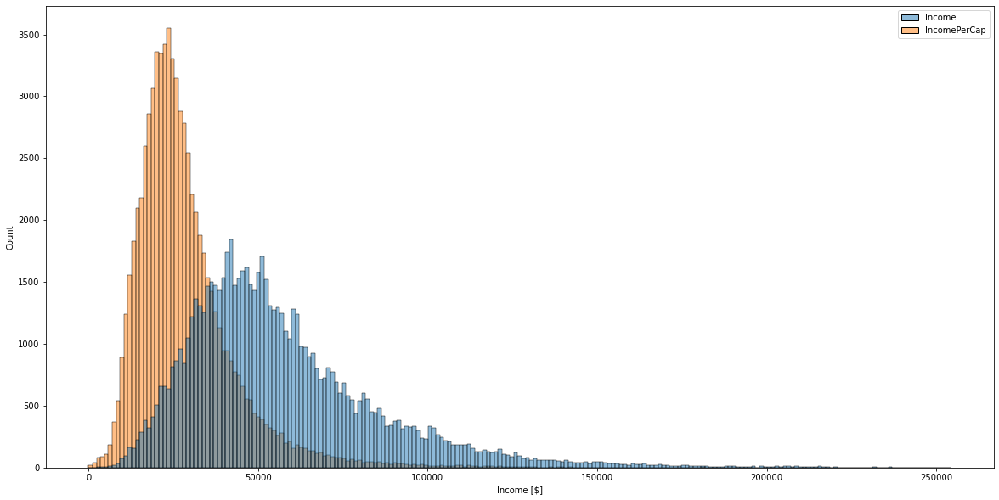

In [42]:
plt.figure(figsize=(20,10))
ax = sns.histplot(data = df[["Income", "IncomePerCap"]])
ax.set(xlabel='Income [$]')

<font color='blue'>
The "Income" as well as "IncomePerCap" are both skewed normale/Gaussian distributions.
The "Income" distributions maximium is not as high as the one of the "IncomePerCap", also it is shifted to higher x-values and wider.
"Income" represents the median houshold income, while "IncomePerCap" is the mean income (per capita).

## Aggregation for Visualization Pruposes
**b)** As the data contains too many rows for per-row visualizations, you should aggregate the data further before creating more interesting visualizations.
The following function will do the job for your; however, why didn't we simply run `groupby(...).mean()` to get the results for the columns
specified in `l_col`?

In [43]:
def my_aggregation(df):
    l_col = ['Men', 'Women', 'Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific', 'Citizen', 'Income', 'IncomePerCap', 
             'Poverty', 'ChildPoverty', 'Professional', 'Service', 'Office', 'Construction', 'Production', 'Drive', 'Carpool', 
             'Transit', 'Walk', 'OtherTransp', 'WorkAtHome', 'MeanCommute', 'Employed', 'PrivateWork', 'PublicWork', 'SelfEmployed', 
             'FamilyWork', 'Unemployment', 'INTPTLAT', 'INTPTLONG']
    df_tmp = df.copy()
    df_tmp.loc[idx[:, l_col]] = df_tmp.loc[idx[:, l_col]].mul(df_tmp['TotalPop'], axis=0)
    df_tmp = df_tmp.groupby(['State', 'County'], observed=True).sum()
    df_tmp.loc[idx[:, l_col]] = df_tmp.loc[idx[:, l_col]].div(df_tmp['TotalPop'], axis=0)
    
    return df_tmp


In [44]:
df = my_aggregation(df)
df.head().transpose()

State              Alabama                                            \
County             Autauga       Baldwin       Barbour          Bibb   
TotalPop      5.525400e+04  1.951708e+05  2.686350e+04  2.267757e+04   
Men           4.843489e+01  4.885785e+01  5.385537e+01  5.341307e+01   
Women         5.156859e+01  5.113470e+01  4.615321e+01  4.656178e+01   
Hispanic      2.642546e+00  4.488181e+00  4.713527e+00  2.300174e+00   
White         7.585685e+01  8.300220e+01  4.633791e+01  7.443957e+01   
Black         1.851706e+01  9.451327e+00  4.664889e+01  2.127493e+01   
Native        4.290033e-01  5.758981e-01  1.644490e-01  4.566211e-01   
Asian         9.578414e-01  6.638610e-01  4.251731e-01  1.061368e-01   
Pacific       1.833526e-02  3.808896e-04  2.801553e-03  6.229569e-04   
Citizen       7.366531e+01  7.568604e+01  7.693131e+01  7.733550e+01   
Income        5.165403e+04  5.105597e+04  3.284130e+04  3.889228e+04   
IncomePerCap  2.492184e+04  2.732560e+04  1.688268e+04  1.851736e+04   
Poverty       1.306369e+01  1.344893e+01  2.639583e+01  1.654887e+01   
ChildPoverty  1.865311e+01  1.946518e+01  4.355912e+01  2.715308e+01   
Professional  3.284328e+01  3.274758e+01  2.611013e+01  2.149215e+01   
Service       1.715360e+01  1.795533e+01  1.641910e+01  1.799697e+01   
Office        2.431104e+01  2.709662e+01  2.329873e+01  1.743234e+01   
Construction  8.555609e+00  1.090115e+01  1.080710e+01  1.930164e+01   
Production    1.714365e+01  1.132512e+01  2.325865e+01  2.377496e+01   
Drive         8.754920e+01  8.460917e+01  8.331653e+01  8.347263e+01   
Carpool       8.773106e+00  8.966526e+00  1.105929e+01  1.318479e+01   
Transit       7.976481e-02  1.115130e-01  5.277312e-01  4.670946e-01   
Walk          4.557772e-01  1.041615e+00  1.972374e+00  6.213857e-01   
OtherTransp   1.313294e+00  1.454066e+00  1.621781e+00  1.550634e+00   
WorkAtHome    1.812320e+00  3.855648e+00  1.497735e+00  7.136012e-01   
MeanCommute   2.648136e+01  2.633548e+01  2.451682e+01  2.873076e+01   
Employed      4.346534e+01  4.406279e+01  3.194321e+01  3.664172e+01   
PrivateWork   7.374096e+01  8.127069e+01  7.157855e+01  7.674644e+01   
PublicWork    2.078366e+01  1.243424e+01  2.115102e+01  1.622334e+01   
SelfEmployed  5.422749e+00  5.914107e+00  7.155351e+00  6.654708e+00   
FamilyWork   -2.682411e-03  3.639475e-01  8.926622e-02  3.947315e-01   
Unemployment  7.765676e+00  7.572219e+00  1.753358e+01  8.186001e+00   
ALAND         1.539590e+09  4.117584e+09  2.291821e+09  1.612482e+09   
AWATER        2.576932e+07  3.177815e+08  5.086468e+07  9.287974e+06   
ALAND_SQMI    5.944400e+02  1.589807e+03  8.848770e+02  6.225830e+02   
AWATER_SQMI   9.948000e+00  1.226960e+02  1.964000e+01  3.587000e+00   
INTPTLAT      3.250199e+01  3.055254e+01  3.186171e+01  3.303384e+01   
INTPTLONG    -8.650957e+01 -8.776645e+01 -8.532840e+01 -8.715027e+01   

State                       
County              Blount  
TotalPop      5.780908e+04  
Men           4.944155e+01  
Women         5.058793e+01  
Hispanic      8.708269e+00  
White         8.804868e+01  
Black         1.563644e+00  
Native        2.870269e-01  
Asian         1.411262e-01  
Pacific      -2.487105e-03  
Citizen       7.344743e+01  
Income        4.610802e+04  
IncomePerCap  2.049526e+04  
Poverty       1.681031e+01  
ChildPoverty  2.687622e+01  
Professional  2.853071e+01  
Service       1.393297e+01  
Office        2.379008e+01  
Construction  1.361388e+01  
Production    2.009586e+01  
Drive         8.491983e+01  
Carpool       1.127730e+01  
Transit       3.674374e-01  
Walk          8.430026e-01  
OtherTransp   4.234857e-01  
WorkAtHome    2.254924e+00  
MeanCommute   3.481069e+01  
Employed      3.845304e+01  
PrivateWork   8.184030e+01  
PublicWork    1.360097e+01  
SelfEmployed  4.231243e+00  
FamilyWork    3.536263e-01  
Unemployment  7.719260e+00  
ALAND         1.670042e+09  
AWATER        1.507746e+07  
ALAND_SQMI    6.448060e+02  
AWATER_SQMI   5.821000e+00  
INTPTLAT      3.3

<font color='blue'>
As the populations differ, we get a difference in the weighted average.

**c)** Next, you should create an overview over column correlations particularly consideirng high/medium/and low incomes.

1) Create a copy `df_plot` of the aggregated dataframe.

In [45]:
df_plot = df.copy()

2) Append a column 'IncomeClass' to `df_plot` containing the 'Income' categories based on the following inter-percentile ranges:
    - low' iff the income is less than the 33% income percentile
    - 'medium' if the income is between the 33% and 66% percentile, and 
    - 'high' iff the income is above the 66% percentile

In [46]:
df_plot = df_plot.assign(IncomeClass = pd.qcut(df_plot['Income'], [0, 0.33, 0.66, 1], ['low', 'medium', 'high']))
assert df_plot.isna().sum().sum() == 0

3) Project the dataframe on the columns that contain percent values (for the sake of readability), that is:

        ['Men', 'Women', 'Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific', 'Poverty', 'ChildPoverty', 
        'Professional', 'Service', 'Office', 'Construction', 'Production',
        'Drive', 'Carpool', 'Transit', 'Walk', 'OtherTransp', 'WorkAtHome',
        'MeanCommute', 'Employed', 'PrivateWork', 'PublicWork', 'SelfEmployed',
        'FamilyWork', 'Unemployment', 'IncomeClass']
        

In [47]:
df_plot_proj = df_plot[['Men', 'Women', 'Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific', 'Poverty', 'ChildPoverty', 
        'Professional', 'Service', 'Office', 'Construction', 'Production',
        'Drive', 'Carpool', 'Transit', 'Walk', 'OtherTransp', 'WorkAtHome',
        'MeanCommute', 'Employed', 'PrivateWork', 'PublicWork', 'SelfEmployed',
        'FamilyWork', 'Unemployment', 'IncomeClass']]

4) Create a parallel coordinates diagram that uses the 'IncomeClass' for coloring the lines. Rotate the x-axis labels by 90° to make them easier to read.
Briefly discuss your results. Do you observe any correlations? Please explain.
    

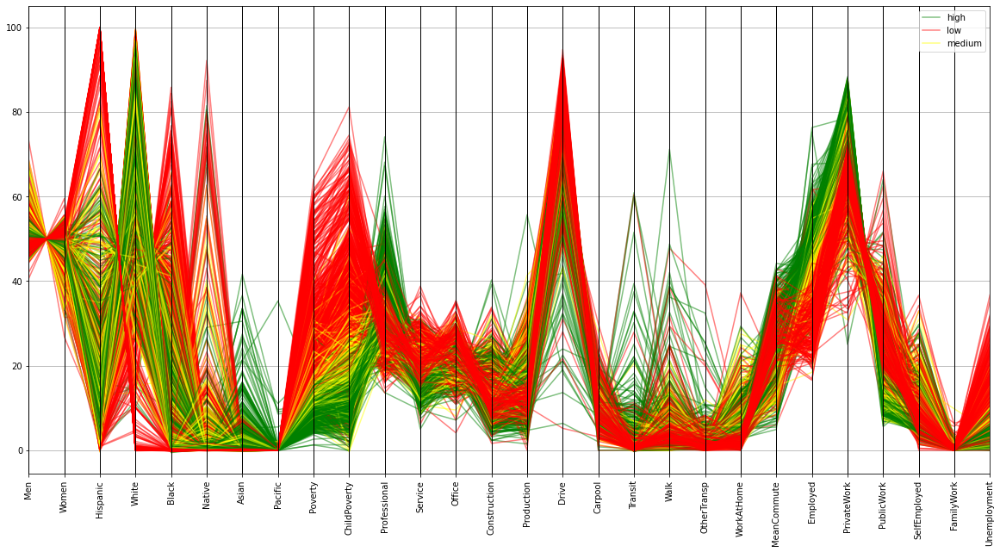

In [48]:
from pandas.plotting import parallel_coordinates
# Make the plot
plt.figure(figsize=(20,10))
fig = parallel_coordinates(df_plot_proj, 'IncomeClass', alpha = 0.5, color=["green", "red", "yellow"])
fig.tick_params(axis='x', labelrotation=90)

<font color='blue'>
Not surprisingly, low income correlates with unemployment and (child) poverty. Professional and private work correlate with high income. White and asian correlates with high income, while all other ethnicities correlate with low income.
One can observe a clear negative correlation between the incomes of the incomes of men and women and a (not perfect) positive correlation between the incomes of poverty and child poverty.

## Advanced Visualization: Map

**d)** In this task, you are going to create an advanced visualization that exploits the geospatial nature of the data, that is, you will project the average 'Income' of each county and its population onto a map of the USA. \
You can use the following code to create a suitable map extend.

    ax.set_extent([-125, -66.5, 20, 50], ...)
        
Given this instance, plot one marker (e.g., circular marker) for each row in our aggregated dataset onto the map.
The color encoding should show the average 'Income' of the corresponding county, while the size should be chosen according to its population ('TotalPop'). If you want to modify the dataframe, create a **working copy** beforehand.

What do you observe?


<GeoAxesSubplot:xlabel='INTPTLONG', ylabel='INTPTLAT'>

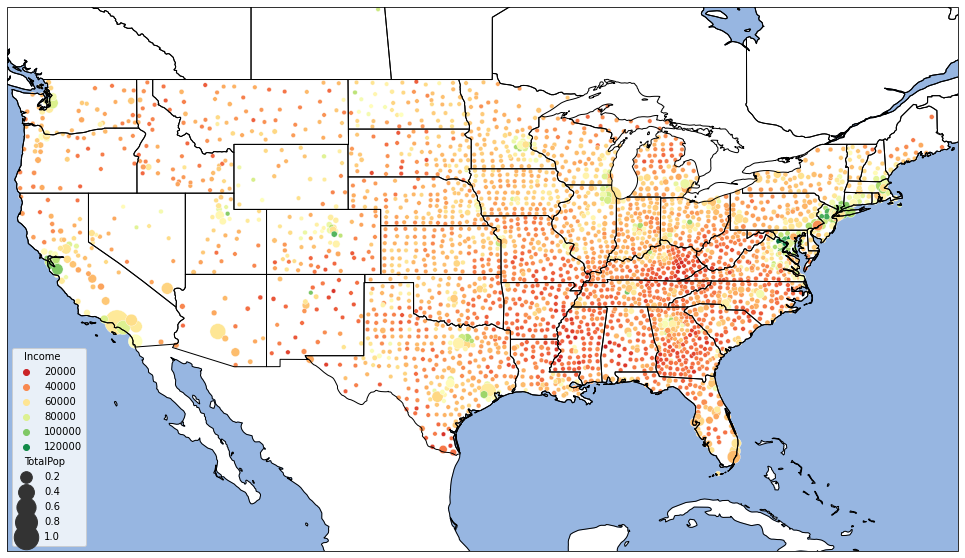

In [49]:
figure = plt.figure(figsize=(20,10))
ax = figure.add_subplot(1,1,1, projection=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.STATES)
ax.add_feature(cfeature.OCEAN)
ax.set_extent([-125, -66.5, 20, 50])

#plt.scatter(x=df_plot["INTPTLONG"], y=df_plot["INTPTLAT"], color="red", s=4, alpha=1, transform=ccrs.PlateCarree())
sns.scatterplot(x='INTPTLONG', y='INTPTLAT', data=df_plot, hue='Income', palette = "RdYlGn", size="TotalPop", sizes=(20, 600))

<font color='blue'>
In general the big and rich cities of the US are at the coasts. Of course there are exceptions, e.g. Miami, Florida and Los Angeles, California are not that rich while Denver, Colorado is pretty rich (Google: "Starting point to the ski areas of the nearby Rocky Mountains"...).
In addition, the east is more populated than the west (with the exception of the already mentioned coastal cities).
The south-east and the south of the mid-west are very poor.

# Q3 - Frequent Itemsets and Association Rules (12 points)

## Frequent Itemsets

**a)** Carry out some preprocessing steps before starting the analysis:

1) Load the `customer_data.csv`.

2) Select 90% of the `customer_data` dataset by random sampling. Use the matriculation number of one of the group members as seed.

3) After completing this preprocessing step, export your final dataset as `customer_data_2.csv` and use it for the next steps of the assignment.

In [50]:
customer_data = pd.read_csv("dataset/customer_data.csv")
customer_data_2 = customer_data.sample(frac = 0.9, random_state = 377818)
customer_data_2.to_csv("dataset/customer_data_2.csv", index = False)

**b)** In this part, we want to get to know our customers by looking at the typical shared characteristics (e.g. "Married customers in their 40s like wine"). This would correspond to the itemset {Married, 40s, Wine}. 

1) Create a new dataframe called `customer_data_onehot` such that rows correspond to customers (as in the original data set) and columns correspond to the categories of each of the ten categorical attributes in the data. The new dataframe should only contain boolean values (True/False or 0/1s) such that the value in row $i$ and column $j$ is True (or 1) if and only if the attribute value corresponding to the column $j$ holds for the customer corresponding to row $i$. Display the dataframe.

*Hint: For example, for the attribute "Education" there are 5 possible categories: 'Graduation', 'PhD', 'Master', 'Basic', '2n Cycle'. Therefore, the new dataframe must contain one column for each of those attribute values.* 

In [51]:
customer_data = pd.read_csv("dataset/customer_data_2.csv")
customer_data_onehot = pd.get_dummies(customer_data, prefix="", prefix_sep="")
customer_data_onehot.transpose()

,0,1,2,3,4,5,6,7,8,9,...,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993
2n Cycle,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Basic,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Graduation,1,1,0,0,1,0,1,1,1,0,...,1,1,1,0,0,1,1,1,1,0
Master,0,0,0,1,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,1
PhD,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
Absurd,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Alone,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Divorced,0,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
Married,1,0,0,1,0,0,0,1,0,1,...,1,0,0,0,1,0,0,1,1,1
Single,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


2) Use the apriori algorithm to find the frequent itemsets with **min_support = 0.3** from the `customer_data_onehot` dataframe. Show the frequent itemsets that contain at least **3** items.

*Hint: The apriori algorithm of mlxtend needs a dataframe containing only boolean values as input.*

In [52]:
freq_itemsets_ap = apriori(customer_data_onehot, min_support = 0.3, use_colnames = True)
freq_itemsets_ap['length'] = freq_itemsets_ap['itemsets'].apply(lambda x: len(x))
freq_itemsets_ap[(freq_itemsets_ap['length'] >= 3)]

,support,itemsets,length
53,0.314945,"(High, Wine, Fruits)",3
54,0.352558,"(High, Wine, Meat)",3
55,0.313440,"(Sweets, Wine, High)",3
56,0.314443,"(High, Fruits, Meat)",3
57,0.313942,"(Sweets, High, Meat)",3
58,0.367603,"(Children, Medium, No Fruits)",3
59,0.324473,"(Children, Medium, No Meat)",3
60,0.362588,"(No Sweets, Children, Medium)",3
61,0.314945,"(Store, Medium, Children)",3
62,0.316449,"(Medium, No Fruits, No Meat)",3


**c)** In the following we will investigate the effect of using the apriori property when determining the candidates for the frequent itemsets.

1) Implement the following join- and prune steps of the Apriori algorithm: \
   **join function:** a function that, given the frequent itemsets of size k, generates and yields a list of itemsets of size k+1. Only itemsets that share exactly k elements should be merged. \
   **prune function:** Given the set of candidate itemsets of size k+1 and the set of frequent itemsets of size k, remove the candidate sets that contain an infrequent subset of size k and return the rest.

In [53]:
def apriori_join(itemset_k):
    k = len(itemset_k[0])
    itemset_kPlus1 = []
    
    for itemset1 in itemset_k:
        for itemset2 in itemset_k:
            intersec = set(itemset1).intersection(set(itemset2))
            if len(intersec) == k-1:
                itemset_kPlus1.append(set(itemset1).union(set(itemset2)))
    
    return itemset_kPlus1

In [54]:
def apriori_prune(itemset_kPlus1, itemset_k):
    itemset_prune = []
    
    for candidate in itemset_kPlus1:
        bool = True
        
        for item in candidate:
            test_subset = candidate.copy()
            test_subset.remove(item)
            if test_subset not in itemset_k:
                bool = False
        
        if bool:
            itemset_prune.append(candidate)
    
    return itemset_prune

2) To see the effect of the apriori property, compare the number of candidate itemsets of size 4 obtained with and without pruning from the itemsets of size three for different values for min_support. To this end, generate a list of tuples *(min_sup, C4_size, C4_size_pruned, L4_size)* as follows:

For $\textrm{min_support} \in [0.1,0.2,...,0.8,0.9,1]$, repeat:

1. Obtain all frequent itemsets of size three using the apriori algorithm.

2. Using the result from 1., generate all itemsets of size four by applying your **join function** $\rightarrow$ C4_size.

3. Prune the result from 2. using your **prune function** $\rightarrow$ C4_size_pruned.

4. Compute the frequent itemsets of size four by using the apriori algorithm $\rightarrow$ L4_size.

In [55]:
min_sup_values = np.arange(0.1,1.1,0.1)
stats = []

for value in min_sup_values:
    frequent_value = apriori(customer_data_onehot, min_support=value, use_colnames=True)
    frequent_size3 = frequent_value[frequent_value.itemsets.apply(lambda x: len(x) == 3)]
    frequent_size4 = frequent_value[frequent_value.itemsets.apply(lambda x: len(x) == 4)]
    
    if not frequent_size3.empty:
        itemsets_3 = frequent_size3['itemsets'].tolist()
        itemsets_4 = apriori_join(itemsets_3)
        itemsets_4_pruned = apriori_prune(itemsets_4, itemsets_3)
        stats.append((value, len(itemsets_4), len(itemsets_4_pruned), len(frequent_size4['itemsets'].tolist())))

3) Plot the number of candidate sets with and without pruning and the number of frequent itemsets of size four against the corresponding min_sup value. Interpret the plot.

Text(0, 0.5, '#candidates left to be scanned')

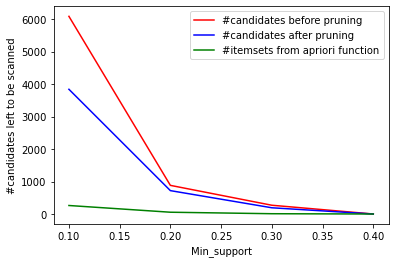

In [56]:
min_sup, C4_size, C4_size_pruned, L4_size = zip(*stats) 

plt.plot(min_sup, C4_size, color = 'red', label = '#candidates before pruning')
plt.plot(min_sup, C4_size_pruned, color = 'blue', label = '#candidates after pruning')
plt.plot(min_sup, L4_size, color = 'green', label = '#itemsets from apriori function')
plt.legend()
plt.xlabel('Min_support')
plt.ylabel('#candidates left to be scanned')

<font color='blue'>
Pruning reduces the number of candidates. Especially for a low support it makes a huge difference. Of course, as the number of candidates approach 0 for higher support, also the impact of the pruning becomes less.

d) Use the FP-Growth algorithm to obtain all frequent itemsets with **min_support = 0.3** from `customer_data_onehot`.

In [57]:
freq_itemsets_fp = fpgrowth(customer_data_onehot, min_support=0.3, use_colnames=True)


## Association Rules

**d)** In the following, you should generate association rules from the frequent itemsets.

1) Using only the frequent itemsets with min_support=0.3, generate different association rules using minimum confidence equal to 0.6 as a metric. Show the association rules.

In [58]:
arules = arule(freq_itemsets_fp, metric="confidence", min_threshold=0.6)
arules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Store),(Children),0.699599,0.713641,0.477934,0.683154,0.957280,-0.021329,0.903780
1,(Children),(Store),0.713641,0.699599,0.477934,0.669712,0.957280,-0.021329,0.909513
2,(No Fruits),(Store),0.540622,0.699599,0.378134,0.699443,0.999778,-0.000084,0.999483
3,(Children),(No Fruits),0.713641,0.540622,0.479940,0.672523,1.243980,0.094130,1.402779
4,(No Fruits),(Children),0.540622,0.713641,0.479940,0.887755,1.243980,0.094130,2.551199
...,...,...,...,...,...,...,...,...,...
338,"(Wine, Meat)","(Sweets, High)",0.485958,0.317954,0.310431,0.638803,2.009106,0.155919,1.888293
339,"(High, Wine)","(Sweets, Meat)",0.369107,0.403711,0.310431,0.841033,2.083253,0.161419,3.751014
340,"(High, Meat)","(Sweets, Wine)",0.357573,0.396189,0.310431,0.868163,2.191287,0.168765,4.579974
341,(Sweets),"(High, Wine, Meat)",0.463892,0.352558,0.310431,0.669189,1.898098,0.146883,1.957138


2) From the association rules obtained in task (d) 1), provide the three rules with the highest lift. Comment on them.

In [59]:
arules.iloc[arules['lift'].nlargest(3).index]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
335,"(Sweets, Wine)","(High, Meat)",0.396189,0.357573,0.310431,0.783544,2.191287,0.168765,2.967939
340,"(High, Meat)","(Sweets, Wine)",0.357573,0.396189,0.310431,0.868163,2.191287,0.168765,4.579974
314,"(High, Meat)","(Wine, Fruits)",0.357573,0.396189,0.309930,0.866760,2.187747,0.168264,4.531764


<font color='blue'>
People with high income like to buy wind, meat and sweets. These three rules with the highest lift all have a lift above 2 and a fairly high confidence of 78-86 %.

# Q4 - Text Mining (15 points)
In this question, you will use the scripts of some Harry Potter movies. First, you will try to predict the character given a line in the script. Afterwards, using N-grams, you will generate sentences for some of the characters.

**a)** In this part, you will preprocess and reconstruct the data to make it suitable for the following tasks.

1) Load each of the datasets <b>hp_1.csv</b>, <b>hp_2.csv</b>, and <b>hp_3.csv</b> into its own dataframe and show the set of characters (here: a fictional character) appearing in each dataset.

In [60]:
hp1=pd.read_csv("dataset/hp_1.csv")
hp2=pd.read_csv("dataset/hp_2.csv")
hp3=pd.read_csv("dataset/hp_3.csv")


In [61]:
#characters appearing in hp1
display(hp1.Character.unique())
#characters appearing in hp2
display(hp2.Character.unique())
#characters appearing in hp3
display(hp3.Character.unique())

array(['Dumbledore', 'McGonagall', 'Hagrid', 'Petunia', 'Dudley',
       'Vernon', 'Harry', 'Snake', 'Someone', 'Barkeep\xa0Tom', 'Man',
       'Witch', 'Quirrell', 'Boy', 'Goblin', 'Griphook', 'Ollivander',
       'Trainmaster', 'Mrs. Weasley', 'George', 'Fred', 'Ginny', 'Ron',
       'Woman', 'Hermione', 'Neville', 'Malfoy', 'Whispers',
       'Sorting Hat', 'Seamus', 'Percy', 'Sir Nicholas', 'Girl',
       'Man in paint', 'Fat Lady', 'Snape', 'Dean', 'Madam Hooch',
       'Class', 'Harry ', 'Fred  ', 'Ron  ', 'George  ', 'Harry  ',
       'Hermione  ', 'Ron ', 'Hermione ', 'Filch', 'All  ', 'Oliver ',
       'Oliver  ', 'Flitwick', 'Draco  ', 'Flitwick  ', 'Seamus  ',
       'Girl  ', 'Boy  ', 'Percy  ', 'McGonagall ', 'Ron and Harry',
       'McGonagall  ', 'Quirrell  ', 'Snape  ', 'OIiver  ', 'Lee Jordan',
       'Hagrid ', 'Gryffindors  ', 'Flint  ', 'Crowd  ', 'Flint',
       'Hagrid  ', 'Man  ', 'Lee  Jordan', 'Madam Hooch ', 'Quirrell ',
       'Filch  ', 'Dumbledore  ', 'Herm

array(['HARRY ', 'VERNON', 'HARRY', 'PETUNIA', 'UNCLE VERNON', 'DUDLEY',
       'AUNT PETUNIA', 'DOBBY', 'DOBBY ', 'UNCLE VERNON ', 'RON',
       'GEORGE', 'FRED', 'GEORGE ', 'AUNT\xa0PETUNIA\xa0& DUDLEY  ',
       'DUDLEY ', 'RON ', 'FRED ', 'MRS. WEASLEY ', 'GINNY ',
       'MR. WEASLEY', 'FRED, GEORGE, RON  ', 'FRED, GEORGE, RON, HARRY  ',
       'PERCY ', 'MR. BORGIN', 'LUCIUS MALFOY', 'DRACO', 'LUCIUS MALFOY ',
       'WITCH', 'HAGRID', 'HERMIONE', 'MAN', 'PHOTOGRAPHER', 'LOCKHART',
       'MRS. WEASLEY', 'TRAINMASTER', 'HARRY AND RON', 'FILCH', 'SNAPE',
       'DUMBLEDORE', 'MCGONAGALL', 'PROFESSOR SPROUT', 'CLASS', 'SEAMUS',
       'PENELOPE CLEARWATER', 'SIR NICHOLAS', 'COLIN', 'DEAN', 'SEAMUS ',
       'NEVILLE', 'GILDEROY LOCKHART', 'CORNISH PIXIES', 'WOOD', 'FLINT',
       'VOICE', 'BOY', 'PICTURE', 'LEE JORDAN', 'SLYTHERINS',
       'MADAM POMFREY', 'MOANING MYRTLE', 'JUSTIN FINCH-FLETCHLEY',
       'SORTING HAT', 'CRABBE', 'PERCY', 'DIARY', 'TOM RIDDLE',
       'HARRY-RON-

array(['HARRY', 'AUNT PETUNIA', 'UNCLE VERNON', 'AUNT MARGE',
       'STAN SHUNPIKE', '\nSTAN SHUNPIKE', 'SHRUNKEN HEAD', 'TOM',
       'FUDGE', 'VENDOR', 'HOUSEKEEPER', 'RON', 'HERMIONE', 'GEORGE',
       'FRED', 'MRS. WEASLEY', 'MR. WEASLEY', 'LUPIN', 'DUMBLEDORE',
       'DRACO', 'SEAMUS', 'FAT LADY', 'DEAN', 'TRELAWNEY', 'NEVILLE',
       'BEM', 'HAGRID', 'PANSY PARKINSON', 'BOY', 'CLASS', 'PARVATI',
       'MCGONAGALL', 'FILCH', 'PERCY', 'GINNY', 'TEACHER', 'SNAPE',
       'CROWD', 'MAN', 'FRED & GEORGE', 'WITCH', 'CRABBE',
       'MADAM ROSMERTA', 'SHRUNKEN HEAD 1', 'SHRUNKEN HEAD 2', 'VOICE',
       'GOYLE', 'SIRIUS', 'PETTIGREW', 'BOY 1', 'BOY 2'], dtype=object)

2) Merge the three datasets into a single dataframe called `hp_df` that comprises only the lines spoken from one of the four characters *Harry, Hermione, Dumbledore, and Snape*. Your new dataframe must contain two columns: one for the (four) characters and the other for the lines. You can name those columns "Character" and "Sentence" as in the original data. \
    Make sure that `hp_df` contains a single unique spelling for each of the characters. \
    Make sure that `hp_df` includes all lines (here: script lines) of a character even if this character is spelled slightly differently (e.g., Dumbledore or dumbledore) in the original dataset. \
    Show the first few lines of your dataframe.
    
*Hint: Be aware of white space characters!*

In [62]:
#first concatanation of the dataframes
hp_all=pd.concat([hp1,hp2,hp3],axis=0)
#remove whitespace and make everything uppercase
#this ensures that case sensitivity and white spaces don't play a role anymore
hp_all['Character']=hp_all['Character'].str.strip().str.upper()
#display all names in order to check for mispelled names
display(np.sort(hp_all.Character.unique()))


array(['ALL', 'ALL 3', 'ARAGOG', 'AUNT MARGE', 'AUNT PETUNIA',
       'AUNT\xa0PETUNIA\xa0& DUDLEY', 'BARKEEP\xa0TOM', 'BEM', 'BOY',
       'BOY 1', 'BOY 2', 'CLASS', 'COLIN', 'CORNISH PIXIES', 'CRABBE',
       'CROWD', 'DEAN', 'DIARY', 'DOBBY', 'DRACO', 'DUDLEY', 'DUMBLEDORE',
       'FAT LADY', 'FILCH', 'FIRENZE', 'FLINT', 'FLITWICK', 'FRED',
       'FRED & GEORGE', 'FRED, GEORGE, RON', 'FRED, GEORGE, RON, HARRY',
       'FUDGE', 'GEORGE', 'GILDEROY LOCKHART', 'GINNY', 'GIRL', 'GOBLIN',
       'GOYLE', 'GRIPHOOK', 'GRYFFINDORS', 'HAGRID', 'HARRY',
       'HARRY AND RON', 'HARRY-RON-HERMIONE', 'HERMIONE', 'HERMOINE',
       'HOUSEKEEPER', 'JUSTIN FINCH-FLETCHLEY', 'LEE  JORDAN',
       'LEE JORDAN', 'LOCKHART', 'LUCIUS MALFOY', 'LUPIN', 'MADAM HOOCH',
       'MADAM POMFREY', 'MADAM ROSMERTA', 'MALFOY', 'MAN', 'MAN IN PAINT',
       'MCGONAGALL', 'MOANING MYRTLE', 'MR. BORGIN', 'MR. WEASLEY',
       'MRS. WEASLEY', 'NEVILLE', 'OIIVER', 'OLIVER', 'OLLIVANDER',
       'PANSY PARKINSON', 

    We see that the name "Hermoine" appears which we assume to be a typo. Therefore we include "Hermoine" in the filtering step below.

In [63]:
#create desired df
hp_df=hp_all[hp_all['Character'].isin(['DUMBLEDORE','HARRY','HERMIONE','HERMOINE','SNAPE'])]
#renaming from HERMOINE to HERMIONE
hp_df.loc[hp_df.Character=="HERMOINE", "Character"] = "HERMIONE"
#check if everything worked
display(hp_df.Character.unique())
display(hp_df.head())

/opt/anaconda3/envs/env-IDS2021-assignment-2/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/anaconda3/envs/env-IDS2021-assignment-2/lib/python3.8/site-packages/pandas/core/indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


array(['DUMBLEDORE', 'HARRY', 'HERMIONE', 'SNAPE'], dtype=object)

,Character,Sentence
0,DUMBLEDORE,"I should've known that you would be here, Prof..."
3,DUMBLEDORE,"I'm afraid so, professor."
4,DUMBLEDORE,The good and the bad.
6,DUMBLEDORE,Hagrid is bringing him.
8,DUMBLEDORE,"Ah, Professor, I would trust Hagrid with my life."


3) Create the `hp_sampled` dataset which includes 90% of the `hp_df` data. Use the matriculation number of one of the group members as seed. Export the sampled dataset. 

In [64]:
hp_sampled=hp_df.sample(frac=0.9,random_state=383400)
hp_sampled.to_csv("output/hp_sampled.csv")

**b)** In this part, you are going to train a classifier that, given a line from the script, predicts the character. For each character, the data contains many sentences belonging to that character. Note that sometimes the "Sentence" column in the original dataset contains more than one sentence. The set of sentences for each character should be seen as the set of example documents belonging to that character (the class). Each individual sentence is a single document. The whole corpus consists of all the individual sentences.

1) Create a new dataframe called `hp_processed` from the dataframe `hp_sampled` such that the new dataframe contains again the columns "Character" and "Sentence", but every entry in the "Sentence" column must be a single sentence. Display the shape of the dataframe and compare it to the shape of `hp_sampled`.

In [65]:

sentences = []
for row in hp_sampled.itertuples():
    for sentence in sent_tokenize(row[2]):
        sentences.append((row[1], sentence))
hp_processed = pd.DataFrame(sentences, columns=['Character', 'SENTENCE'])



In [66]:
print("Shape of the sampled dataframe: {}".format(hp_sampled.shape))
print("Shape of the processed dataframe: {}".format(hp_processed.shape))

Shape of the sampled dataframe: (1688, 2)
Shape of the processed dataframe: (1930, 2)


    We see that 242 new rows were created. This is expected as we splitted the sentences.

2) Split the preprocessed data `hp_processed` into training (80%) and test (20%) data preserving the distribution based on "Character". 

In [67]:
hp_train, hp_test = train_test_split(hp_processed, test_size = 0.2, stratify=hp_processed.Character,random_state=383400)

In [68]:
hp_train.head()

,Character,SENTENCE
1278,SNAPE,Our new celebrity.
696,HERMIONE,Voice?
1849,HARRY,15th Century Fiends...Flamel...
211,DUMBLEDORE,"She sacrificed herself for you, and that kind ..."
349,HERMIONE,That was so scary.


3) Preprocess the training and test corpus (to lowercase, no punctuation, tokenization, lemmatization, and stopword removal) and obtain a boolean document-term matrix (i.e, each row in the matrix contains only 1s and 0s depending on whether a particular word appears in a sentence or not). Train a logistic classifier on the training corpus with the character as target feature. Use the classifier to predict the character of the sentences in the test corpus and show its accuracy on the test corpus. Comment on the result.

In [69]:
#this is faster than the flattening function seen in the instructions
#def flatten(lists):
    #return [item for sublist in lists for item in sublist]
#won't be used but list iterations are cool :P

In [70]:
#preprocessing
lemmatizer = WordNetLemmatizer()

train_texts=hp_train['SENTENCE'].tolist()
train_texts = [text.lower() for text in train_texts]
train_texts = [nltk.RegexpTokenizer(r"\w+").tokenize(text) for text in train_texts]
train_texts = [[word for word in wordlist if word not in stopwords.words('english')] for wordlist in train_texts]
train_texts = [[lemmatizer.lemmatize(word) for word in wordlist] for wordlist in train_texts]
train_texts[:5] #check if the preprocessing worked

    

[['new', 'celebrity'],
 ['voice'],
 ['15th', 'century', 'fiend', 'flamel'],
 ['sacrificed', 'kind', 'act', 'leaf', 'mark'],
 ['scary']]

    We know that there exist other ways to preprocess but we did it this way as it was easier to debug. 

In [71]:
# determine existing words in the preprocessed training corpus
vocabular = [word for wordlist in train_texts for word in wordlist]

# drop duplicates
vocabular = list(set(vocabular))

In [72]:
# create binary document-term matrix for train_data
binary_train_data = [[1 if word in wordlist else 0 for word in vocabular] for wordlist in train_texts]

# add column for out of vocabulary words (we noticed later that we did not need this step)
#but we still chose to keep it
binary_train_data_unk = [binary_train_data[i] + [0] for i in range(len(binary_train_data))]

In [73]:
#index command is used so that we can keep track of the characters responsible for a given wordlist
df_train = pd.DataFrame(binary_train_data_unk, index=hp_train.index)
df_train.columns = vocabular + ['<UNK>']
df_train['Character']=hp_train['Character']
df_train.head()

,knew,responsible,moving,marvolo,remarkable,sufficient,easy,bogy,action,devastation,...,besides,state,shift,successfully,attack,whatever,cousin,century,<UNK>,Character
1278,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,SNAPE
696,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,HERMIONE
1849,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,HARRY
211,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,DUMBLEDORE
349,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,HERMIONE


In [74]:
#preprocessing for test texts
lemmatizer = WordNetLemmatizer()

test_texts=hp_test['SENTENCE'].tolist()
test_texts = [text.lower() for text in test_texts]
test_texts = [nltk.RegexpTokenizer(r"\w+").tokenize(text) for text in test_texts]
test_texts = [[word for word in wordlist if word not in stopwords.words('english')] for wordlist in test_texts]
test_texts = [[lemmatizer.lemmatize(word) for word in wordlist] for wordlist in test_texts]
test_texts[:5] #check if the preprocessing worked

[['sure', 'madam', 'pomfrey', 'fix', 'heartbeat'],
 ['think', 'fancy'],
 [],
 ['want', 'move', 'bit', 'closer'],
 ['student',
  'must',
  'equipped',
  'one',
  'standard',
  'size',
  '2',
  'pewter',
  'cauldron',
  'may',
  'bring',
  'desire',
  'either',
  'owl',
  'cat',
  'toad']]

In [75]:
# create binary document-term matrix for test_data
binary_test_data = [[1 if word in wordlist else 0 for word in vocabular] for wordlist in test_texts]

#take unknown words into account
#empty wordlists get also assigned to <UNK>
binary_test_data_unk = [binary_test_data[i] + [0] if sum(binary_test_data[i])>0 else binary_test_data[i] + [1]
                        for i in range(len(binary_test_data))]

    Note: Empty wordlists get also the value <UNK>. We deem this as unproblematic because we know that the column <UNK> is not useful for prediction and therefore these values should have little influence on the prediction.

In [76]:
#index command is used so that we can keep track of the characters responsible for a given wordlist
df_test = pd.DataFrame(binary_test_data_unk, index=hp_test.index)
df_test.columns = vocabular + ['<UNK>']
df_test['Character']=hp_test['Character']
df_test.head()

,knew,responsible,moving,marvolo,remarkable,sufficient,easy,bogy,action,devastation,...,besides,state,shift,successfully,attack,whatever,cousin,century,<UNK>,Character
1813,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,HERMIONE
999,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,HARRY
1451,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,HARRY
1193,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,HERMIONE
1381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,HARRY


In [77]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# define parameters
descriptive_train=df_train[df_train.columns[:-1]]
target_train=df_train[df_train.columns[-1]]
lreg_param_grid = {
    "C": [0.001, 0.1, 1.0],
    "class_weight": ["balanced"],
    "solver": ["liblinear", "newton-cg"]
}
# train model
lreg = GridSearchCV(LogisticRegression(), lreg_param_grid, scoring='accuracy', cv=5)
lreg.fit(descriptive_train, target_train)

print(lreg.best_params_)

{'C': 0.1, 'class_weight': 'balanced', 'solver': 'liblinear'}


In [78]:
from sklearn.metrics import accuracy_score

descriptive_test=df_test[df_test.columns[:-1]]
target_test=df_test[df_test.columns[-1]]
target_pred_test=lreg.predict(descriptive_test)
score=accuracy_score(target_test,target_pred_test)
print("\nAccuracy of model on test data: {:.2f}%".format(score*100))


Accuracy of model on test data: 58.81%


In [79]:
print("\nDistribution of training data:")
print(np.unique(target_train, return_counts=True))

print("\nDistribution of test data:")
print(np.unique(target_test, return_counts=True))

print("\nDistribution of predicted data across the four characters:")
print(np.unique(target_pred_test, return_counts=True))

print("\nCorrect predictions per character in test data")
print(np.unique(target_pred_test[target_pred_test==target_test], return_counts=True))


Distribution of training data:
(array(['DUMBLEDORE', 'HARRY', 'HERMIONE', 'SNAPE'], dtype=object), array([187, 857, 410,  90]))

Distribution of test data:
(array(['DUMBLEDORE', 'HARRY', 'HERMIONE', 'SNAPE'], dtype=object), array([ 47, 214, 102,  23]))

Distribution of predicted data across the four characters:
(array(['DUMBLEDORE', 'HARRY', 'HERMIONE', 'SNAPE'], dtype=object), array([ 12, 353,  15,   6]))

Correct predictions per character in test data
(array(['DUMBLEDORE', 'HARRY', 'HERMIONE', 'SNAPE'], dtype=object), array([  5, 208,  10,   4]))


    We observe an accuracy of almost 60%. This is a significant improvement over random guessing (expected accuracy of 25%) but the result is also not very good. This is really not a surprise as this approach is not too sophisticated (simple checking of occuring words). If we had an almost perfect accuracy, this would mean that some words are almost exclusively used by a single character. Knowing how language works, this is very unrealistic.
    Further problems arise because our training data are heavily biased in favor of Harry. ~55% of all training sentences are from Harry (which is normal as he's the main character) but we notice that this results in a prediction that predicts Harry too often (more than 90%). As a result, our accuracy is only so high because most of the lines are from Harry and our model almost every time predicts Harry. 
    We conjecture that training for balanced accuracy would make more sense as this hinders our model to over-emphasize one character for prediction.

*Your markdown for your discussion.*

4) Next, you are going to perform the same predicting task based on doc2vec.

1. Preprocess the training corpus (to lowercase, no punctuation, tokenization, lemmatization, and stopword removal). 
2. Create a doc2vec model to reduce the dimension of the document vector. Choose a vector size 4-8 and ignore all words whose count is lower than 3.
3. Train the doc2vec model on the training data (thus creating an embedding).
4. Use the created embedding to convert the training set to a set of document vectors.
5. Train a logistic classifier on the train data with the character as target feature.
6. Show the accuracy of prediction on the test data and comment on it.


    Note: Preprocessing was already done in the steps before

In [80]:
corpus_train=train_texts
#create tagged documents where the "tag" only serves as a document identifier 
tagged_documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(corpus_train)]

# create model with given parameters
#we chose a vector size of 8 because with such low vector sizes 
#it really doesn't hurt to use the maximal one
model = Doc2Vec(tagged_documents, vector_size=8,min_count=3)

# building the vocabulary    
model.build_vocab(tagged_documents)
training_examples = model.corpus_count
# obtain the compressed vectors 
model.train(corpus_iterable=tagged_documents, total_examples=training_examples, epochs=100)

In [81]:
#classifier
corpus_test=test_texts
classifier_doc2vec = LogisticRegression()

train_vectors = [model.infer_vector(doc) for doc in corpus_train]
train_target = hp_train['Character']

test_vectors = [model.infer_vector(doc) for doc in corpus_test]
test_target = hp_test['Character']

classifier_doc2vec = classifier_doc2vec.fit(X=train_vectors, y=train_target)

print('Evaluating model on test set')

print('doc2vec - Classifier accuracy on test set:')
print(classifier_doc2vec.score(test_vectors, test_target))

Evaluating model on test set
doc2vec - Classifier accuracy on test set:
0.5544041450777202


    While we don't see an improvement with doc2vec we also don't see much of a deterioration. The accuracy remains more or less the same. But in the model before we encoded sentences in vectors of size 1319 (number of columns of the binary document matrix) and now we encode words in vectors of size 8. 
    We see that we weren't able to improve our accuracy but we managed to decrease dimensionality by a great deal which is also a valuable step in many machine learning tasks.

In [82]:
#quick overview of the data
hp_processed.head()

,Character,SENTENCE
0,HARRY,"What is it, Fang?"
1,HARRY,All we need to do is catch up with the train.
2,DUMBLEDORE,Riddle!
3,DUMBLEDORE,Come.
4,HARRY,But she’s bored!


**c)** For the following tasks use the `hp_processed` (the data before splitting into training and test data).

1) For each character, create a list containing all sentences of that character.
    For each character separately, build a bigram language model using MLE. Do not perform stemming and stopword removal for this task, but apply other preprocessing steps such as to lowercase, no punctuation, and tokenization. Use both right and left padding.

In [83]:
#preprocessing for all sentences regradless of character
texts=hp_processed['SENTENCE'].tolist()
texts = [text.lower() for text in texts]
texts = [nltk.RegexpTokenizer(r"\w+").tokenize(text) for text in texts]
#check if it worked
print(texts[:5])


[['what', 'is', 'it', 'fang'], ['all', 'we', 'need', 'to', 'do', 'is', 'catch', 'up', 'with', 'the', 'train'], ['riddle'], ['come'], ['but', 'she', 's', 'bored']]


In [84]:
#filter based on character
hp_processed_copy=hp_processed.copy()
hp_processed_copy['SENTENCE']=texts
texts_harry=hp_processed_copy[hp_processed_copy['Character']=='HARRY']['SENTENCE']
texts_hermione=hp_processed_copy[hp_processed_copy['Character']=='HERMIONE']['SENTENCE']
texts_dumbledore=hp_processed_copy[hp_processed_copy['Character']=='DUMBLEDORE']['SENTENCE']
texts_snape=hp_processed_copy[hp_processed_copy['Character']=='SNAPE']['SENTENCE']

In [85]:
#harry
padded_tuples_harry, vocab_harry = padded_everygram_pipeline(2, texts_harry)
# generate (an empty) ngram language model for some n>0
lm_bigram_harry = MLE(2)
# generate probabilities (model) given the list of n-grams and the vocabulary
lm_bigram_harry.fit(padded_tuples_harry, vocab_harry)

In [86]:
#hermione
padded_tuples_hermione, vocab_hermione = padded_everygram_pipeline(2, texts_hermione)
# generate (an empty) ngram language model for some n>0
lm_bigram_hermione = MLE(2)
# generate probabilities (model) given the list of n-grams and the vocabulary
lm_bigram_hermione.fit(padded_tuples_hermione, vocab_hermione)

In [87]:
#dumbledore
padded_tuples_dumbledore, vocab_dumbledore = padded_everygram_pipeline(2, texts_dumbledore)
# generate (an empty) ngram language model for some n>0
lm_bigram_dumbledore = MLE(2)
# generate probabilities (model) given the list of n-grams and the vocabulary
lm_bigram_dumbledore.fit(padded_tuples_dumbledore, vocab_dumbledore)

In [88]:
#snape
padded_tuples_snape, vocab_snape = padded_everygram_pipeline(2, texts_snape)
# generate (an empty) ngram language model for some n>0
lm_bigram_snape = MLE(2)
# generate probabilities (model) given the list of n-grams and the vocabulary
lm_bigram_snape.fit(padded_tuples_snape, vocab_snape)

2) For each character, use the created language model to generate a sentence of ten words. Display the sentences.

In [89]:
print(lm_bigram_harry.generate(10))
print(lm_bigram_hermione.generate(10))
print(lm_bigram_dumbledore.generate(10))
print(lm_bigram_snape.generate(10))

['kind', 'of', 'dark', 'wizards', 'can', 'tell', 'me', '</s>', 'does', 'i']
['</s>', 'be', 'okay', 'bye', '</s>', 'you', 'don', 't', '</s>', '</s>']
['petrified', '</s>', 'both', 'just', 'fine', '</s>', '<s>', 'why', 'tomorrow', 'it']
['little', 'walk', 'in', 'slytherin', '</s>', 'potter', 'to', 'page', '394', '</s>']


3) Build a 4-gram model with the same data as in the previous task. Use both right and left padding.

In [90]:
padded_tuples_harry, vocab_harry = padded_everygram_pipeline(4, texts_harry)
lm_quatrogram_harry = MLE(4)
lm_quatrogram_harry.fit(padded_tuples_harry, vocab_harry)

padded_tuples_hermione, vocab_hermione = padded_everygram_pipeline(4, texts_hermione)
lm_quatrogram_hermione = MLE(4)
lm_quatrogram_hermione.fit(padded_tuples_hermione, vocab_hermione)

padded_tuples_dumbledore, vocab_dumbledore = padded_everygram_pipeline(4, texts_dumbledore)
lm_quatrogram_dumbledore = MLE(4)
lm_quatrogram_dumbledore.fit(padded_tuples_dumbledore, vocab_dumbledore)

padded_tuples_snape, vocab_snape = padded_everygram_pipeline(4, texts_snape)
lm_quatrogram_snape = MLE(4)
lm_quatrogram_snape.fit(padded_tuples_snape, vocab_snape)

4) For each character, use the created 4-gram language model to generate a sentence of ten words. Display the sentences.

In [91]:
print(lm_quatrogram_harry.generate(10))
print(lm_quatrogram_hermione.generate(10))
print(lm_quatrogram_dumbledore.generate(10))
print(lm_quatrogram_snape.generate(10))

['i', 'don', 't', 'know', 'exactly', 'what', 'it', 'means', '</s>', '</s>']
['something', 'happened', 'he', 'wants', 'us', 'to', 'change', '</s>', '</s>', '</s>']
['</s>', '</s>', '</s>', '</s>', '</s>', '</s>', '</s>', '</s>', '</s>', '</s>']
['flicker', 'of', 'fear', '</s>', '</s>', '</s>', '</s>', '</s>', '</s>', '</s>']


5) Compare the sentences generated by the bigram model with the sentences generated by the 4-gram model.

    Observation: The result is ambiguous:
    On one hand, we see that the sentences generated by 4-gram make more sense than the ones generated by the bigram model, it is much closer to actual language. This is due to the fact that a 4-gram model is able to catch more context.
    On the other hand, we see that this model will always produce "sentences" consisting of the </s> element. This is a result of the padding which produces many tokens in the form of </s></s></s><Word> (as we have a 4-gram model). A way to circumvent this is if we imposed that a sentence must not contain for instance more than 3 </s> elements at the beginning of the sentence.

# Q5 - Process Mining (23 points)

In this task, we consider a simulated process of students that participate in an online course.
The course comprises 6 batches of lecture material as well as a mandatory assignment to be delivered in two parts. (Note that in this process, it is not required to achieve a certain score in the assignment in order to be admitted to the exam.)

While there are strict deadlines for the assignment and the exam, there is only a recommended schedule for the lecture material (i.e., consume material in order).

The system logs for every student, among other activities, when he downloads a certain lecture material batch. 

## Loading the Data and Basic Statistics

**a)** Load the data **log.csv** and create a PM4Py event log. In doing so, use the following column mapping:
 - 'Activity' is the activity key
 - 'Student' is the case ID
 - 'Timestamp' is the timestamp

In [92]:
df = pd.read_csv('dataset/log.csv', sep=',')
df = pm4py.format_dataframe(df, case_id='Student', activity_key='Activity', timestamp_key='Timestamp') # Simplified interface. Does the formating for you
# Let's see what this does
display(df.head())
log = log_converter.apply(df)

,time:timestamp,case:concept:name,concept:name,Lifecycle,Points,@@index
1413,2021-10-05 21:29:31+00:00,343516,Register,complete,NaN,1413
6537,2021-12-03 08:30:11+00:00,343516,Assignment 1,complete,78.0,6537
7060,2021-12-03 21:39:25+00:00,343516,Consume Lecture Material 3,complete,NaN,7060
8198,2021-12-05 04:04:49+00:00,343516,Consume Lecture Material 1,complete,NaN,8198
8868,2021-12-06 05:21:45+00:00,343516,Consume Lecture Material 2,complete,NaN,8868


**b)** Compute the following basic information:
- Number of events
- Number of cases
- Earliest timestamp
- Latest timestamp
- Number of trace variants

In [93]:
number_events=len(df['case:concept:name'])
number_cases=len(df['case:concept:name'].unique())


In [94]:
print(f'Number of events: {number_events}')
print(f'Number of cases: {number_cases}')
print("Earliest timestamp: " + str(df['time:timestamp'].min()))
print("Latest timestamp:   " + str(df['time:timestamp'].max()))
print("Number of variants:   " + str(len(variants_filter.get_variants(log))))


Number of events: 19652
Number of cases: 2000
Earliest timestamp: 2021-09-15 00:18:18+00:00
Latest timestamp:   2022-02-20 14:00:00+00:00
Number of variants:   432


**c)** Usually, it is insightful to have a look at the distribution of the variants in terms of how often a certain variant is present in the log.
Therefore, create a **scatter plot** that shows the distribution of the variants as follows:
- x-axis: The variants (in ascending order of their support)
- y-axis: Frequency of the variant in the log (total or relative)

<AxesSubplot:ylabel='frequency'>

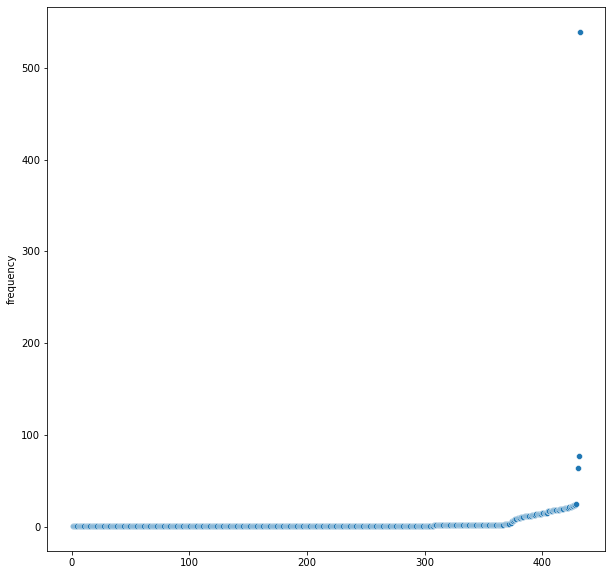

In [95]:
variants_count = case_statistics.get_variant_statistics(log)
#ascending order
variants_count = sorted(variants_count, key=lambda x: x['count'], reverse=False)
frequency_list=[variant['count'] for variant in variants_count]
plot_df=pd.DataFrame(frequency_list,columns=['frequency'],index=np.arange(1,433))
plot_df['variants']=[variant['variant'] for variant in variants_count]
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(ax=ax,data=plot_df,y='frequency',x=np.arange(1,433))

**d)** While the variant distribution shows potential standard process executions in terms of the activity ordering, the distribution of the case durations shows the typical timeframe of cases.
Create a histogram plot over the case durations. For the sake of readability, make sure that the x-axis labels (in this case the case durations) have an easily readable format, that is, your x-axis labels should look like this:
<br></br>
<div>
<img src="templates/caseDurationXAxis.png" width="500"/>
</div>

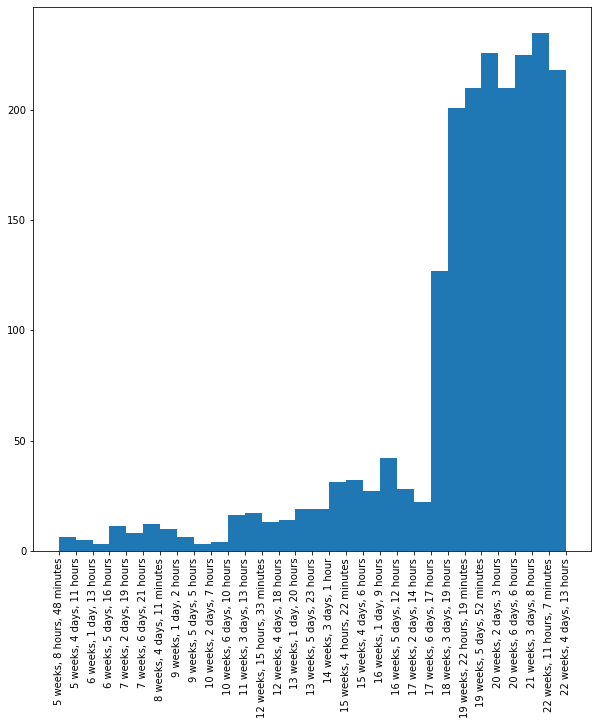

In [96]:
all_case_durations = case_statistics.get_all_case_durations(log, parameters={
    case_statistics.Parameters.TIMESTAMP_KEY: "time:timestamp"})


intervals = (
    ('weeks', 604800),  # 60 * 60 * 24 * 7
    ('days', 86400),    # 60 * 60 * 24
    ('hours', 3600),    # 60 * 60
    ('minutes', 60),
    ('seconds', 1),
)
#this function transforms time in seconds into more readable format
def display_time(seconds, detail=3):
    result = []

    for name, count in intervals:
        value = seconds // count
        if value:
            seconds -= value * count
            if value == 1:
                name = name.rstrip('s')
            result.append("{} {}".format(int(value), name))
    return ', '.join(result[:detail])
#we don't use seaborn histplot here as labeling is more complicated
plt.figure(figsize=(10,10))
hist=plt.hist(all_case_durations,bins=30)
ticks=[display_time(i) for i in hist[1]]

plt.xticks(hist[1],ticks,rotation=90)
hist;

## Discovery and Conformance Checking
Next, you are going to discover process models for different perspectives on the process. Moreover, you will evaluate how well the process models can represent the behavior present in the log (i.e., the fitness of the models).

### Filtering

**e)** Before discovering models, create three addtional perspectives onto the process by creating three additional event log from the log loaded in a):

1. Log containing only 30% of the most frequent traces (**log_varaint03**)
2. Log containing only 50% of the most frequent traces (**log_varaint05**)
3. Log containing only students that take the exam, that is, cases that end with 'Exam' (**log_exam**)

In [97]:
from pm4py.algo.filtering.log.end_activities import end_activities_filter
log_varaint03 = variants_filter.filter_log_variants_percentage(log, percentage=0.3)
log_varaint05 = variants_filter.filter_log_variants_percentage(log, percentage=0.5)
log_exam=end_activities_filter.apply(log, ["Exam"])

### Inductive Miner and Replay Fitness

**f)** To get a better understanding of the processes in our four event logs (base log + three additional logs), create processes models using the **Inductive Miner**.
Concretely, for each of the 4 event logs, create two process models using the Inductive Miner with noise threshold **0 and 0.2**. Moreover, to access how well the model presents the logged behavior, apply conformance checking in terms of token-based replay to the model and the log from which it has been mined. Visualize each model as a process tree and as the corresponding Petri net.

In total, your cells should output 8 conformance scores, 8 process trees, and 8 Petri nets (for each log + noise threshold combination). Make sure that it is clear which model and conformance score belongs to log and parameter configuration.

For example, your output can look like this
#### Log: Base
##### IM threshold 0
>Fitness score

>Picture of the process tree

>Picture of the Petri net

##### IM threshold 0.2
>Fitness score

>Picture of the process tree

>Picture of the Petri net

**Describe your results**. How well do the models fit and, in particular, how do the models for
- log_variant05 and log (base log)
- log_variant05 and log_variant03
- log base and log_exam

differ in terms of the behavior that they allow?


#### Log: Base
##### IM threshold 0

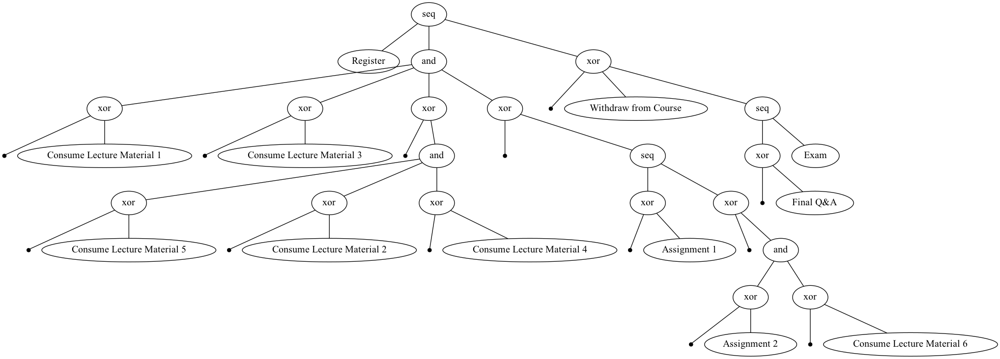

In [98]:
proc_tree1 = pm4py.discover_process_tree_inductive(log)
gviz1 = pt_visualizer.apply(proc_tree1, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz1)

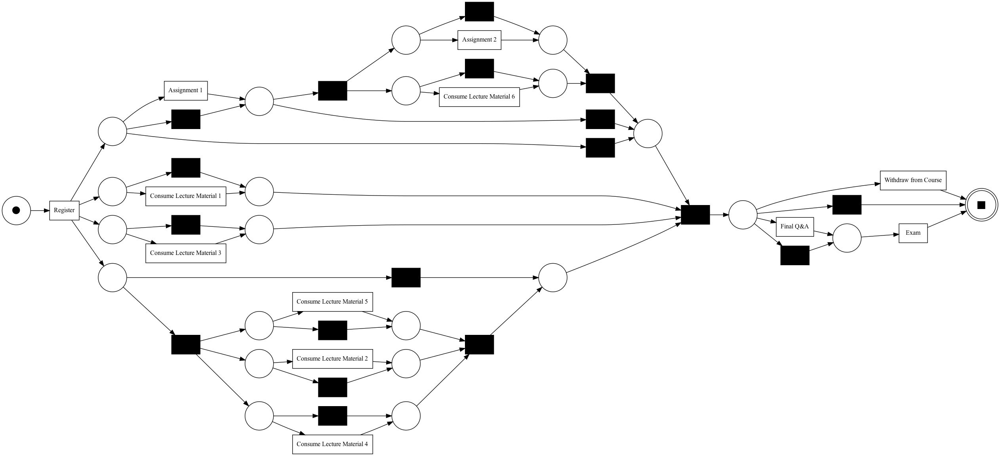

In [99]:
net1, im1, fm1 = pt_converter.apply(proc_tree1)
pm4py.view_petri_net(net1, im1, fm1, format='png') 

In [100]:
fitness1 = replay_fitness_evaluator.apply(log, net1, im1, fm1, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
display(fitness1)

replaying log with TBR, completed variants :: 100%|██████████| 432/432 [00:00<00:00, 1353.64it/s]


{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

#### Log: Base
##### IM threshold 0,2

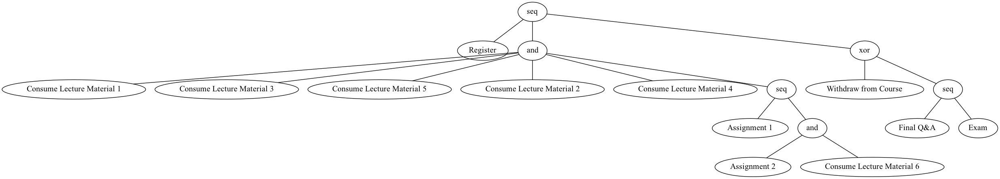

In [101]:
proc_tree2 = pm4py.discover_process_tree_inductive(log, noise_threshold=0.2)
gviz2 = pt_visualizer.apply(proc_tree2, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz2)

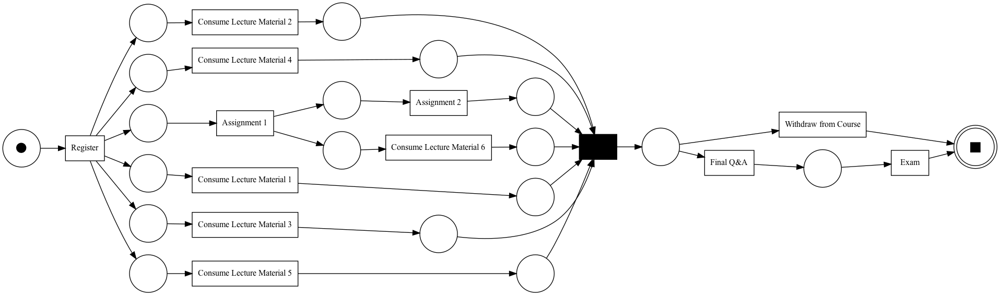

In [102]:
net2, im2, fm2 = pt_converter.apply(proc_tree2)
pm4py.view_petri_net(net2, im2, fm2, format='png') 

In [103]:
fitness2 = replay_fitness_evaluator.apply(log, net2, im2, fm2, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
display(fitness2)

replaying log with TBR, completed variants :: 100%|██████████| 432/432 [00:00<00:00, 1866.80it/s]


{'perc_fit_traces': 69.3,
 'average_trace_fitness': 0.905576373340711,
 'log_fitness': 0.9325048340840334,
 'percentage_of_fitting_traces': 69.3}

#### Log: 30%
##### IM threshold 0

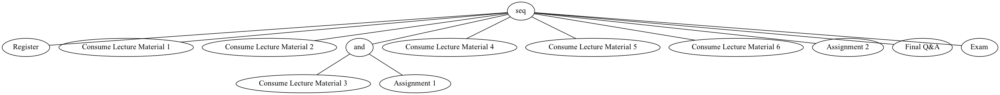

In [104]:
proc_tree3 = pm4py.discover_process_tree_inductive(log_varaint03)
gviz3 = pt_visualizer.apply(proc_tree3, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz3)

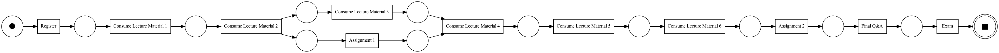

In [105]:
net3, im3, fm3 = pt_converter.apply(proc_tree3)
pm4py.view_petri_net(net3, im3, fm3, format='png') 

In [106]:
fitness3 = replay_fitness_evaluator.apply(log_varaint03, net3, im3, fm3, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
display(fitness3)

replaying log with TBR, completed variants :: 100%|██████████| 2/2 [00:00<00:00, 518.01it/s]


{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

#### Log: 30%
##### IM threshold 0,2

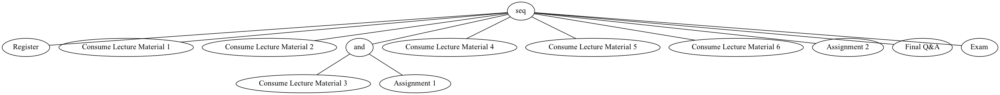

In [107]:
proc_tree4 = pm4py.discover_process_tree_inductive(log_varaint03, noise_threshold=0.2)
gviz4 = pt_visualizer.apply(proc_tree4, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz4)

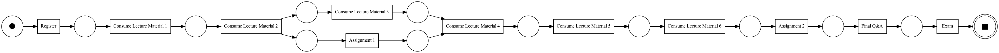

In [108]:
net4, im4, fm4 = pt_converter.apply(proc_tree4)
pm4py.view_petri_net(net4, im4, fm4, format='png') 

In [109]:
fitness4 = replay_fitness_evaluator.apply(log_varaint03, net4, im4, fm4, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
display(fitness4)

replaying log with TBR, completed variants :: 100%|██████████| 2/2 [00:00<00:00, 117.61it/s]


{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

#### Log: 50%
##### IM threshold 0

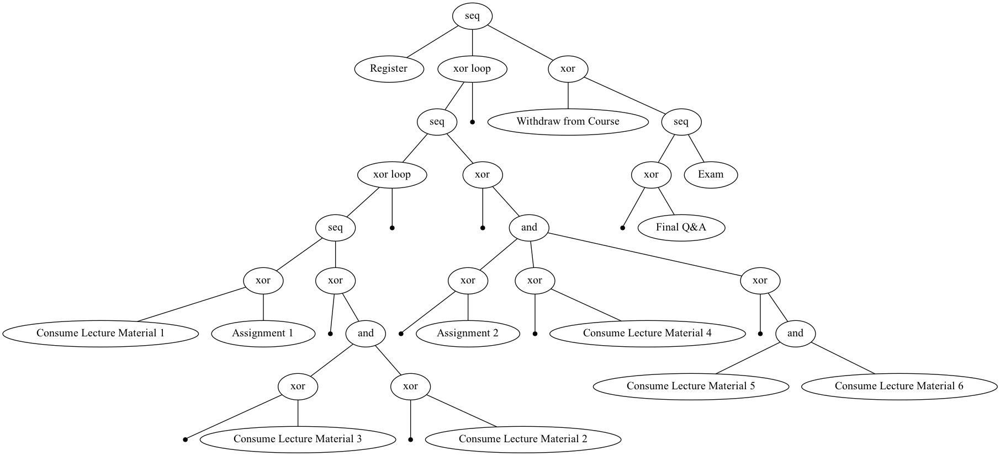

In [110]:
proc_tree5 = pm4py.discover_process_tree_inductive(log_varaint05)
gviz5 = pt_visualizer.apply(proc_tree5, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz5)

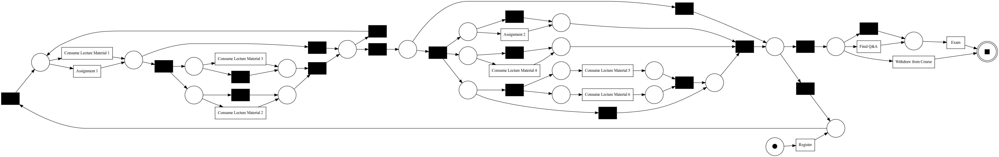

In [111]:
net5, im5, fm5 = pt_converter.apply(proc_tree5)
pm4py.view_petri_net(net5, im5, fm5, format='png') 

In [112]:
fitness5 = replay_fitness_evaluator.apply(log_varaint05, net5, im5, fm5, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
display(fitness5)

replaying log with TBR, completed variants :: 100%|██████████| 18/18 [00:00<00:00, 787.16it/s]


{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

#### Log: 50%
##### IM threshold 0,2

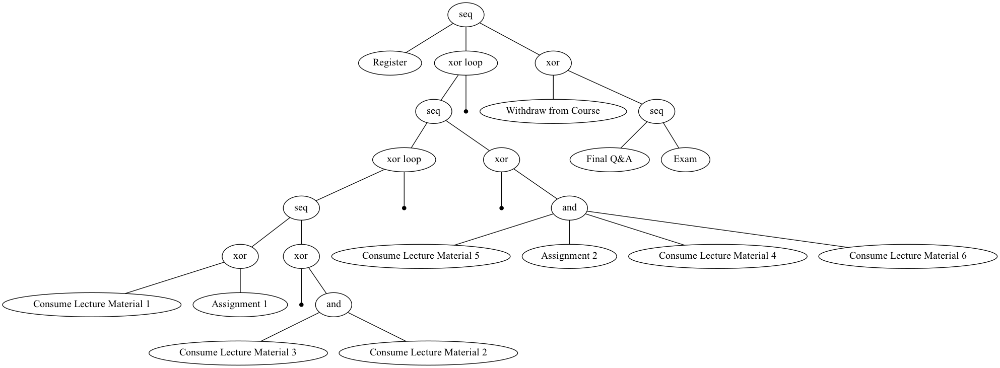

In [113]:
proc_tree6 = pm4py.discover_process_tree_inductive(log_varaint05, noise_threshold=0.2)
gviz6 = pt_visualizer.apply(proc_tree6, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz6)

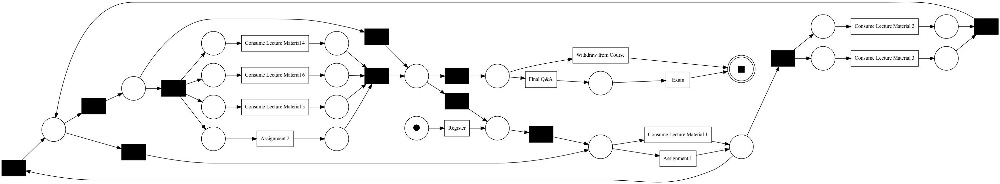

In [114]:
net6, im6, fm6 = pt_converter.apply(proc_tree6)
pm4py.view_petri_net(net6, im6, fm6, format='png') 

In [115]:
fitness6 = replay_fitness_evaluator.apply(log_varaint05, net6, im6, fm6, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
display(fitness6)

replaying log with TBR, completed variants :: 100%|██████████| 18/18 [00:00<00:00, 943.80it/s]


{'perc_fit_traces': 76.86196623634558,
 'average_trace_fitness': 0.9803935624172175,
 'log_fitness': 0.9844609736446894,
 'percentage_of_fitting_traces': 76.86196623634558}

#### Log: Exam
##### IM threshold 0

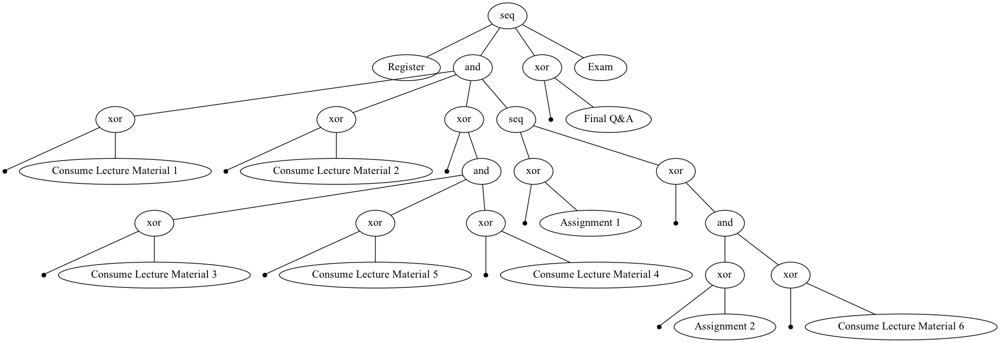

In [116]:
proc_tree7 = pm4py.discover_process_tree_inductive(log_exam)
gviz7 = pt_visualizer.apply(proc_tree7, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz7)

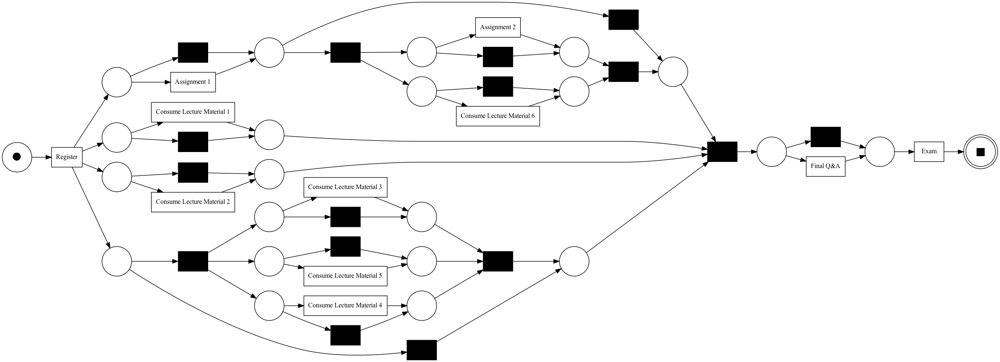

In [117]:
net7, im7, fm7 = pt_converter.apply(proc_tree7)
pm4py.view_petri_net(net7, im7, fm7, format='png') 

In [118]:
fitness7 = replay_fitness_evaluator.apply(log_exam, net7, im7, fm7, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
display(fitness7)

replaying log with TBR, completed variants :: 100%|██████████| 397/397 [00:00<00:00, 1392.95it/s]


{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

#### Log: Exam
##### IM threshold 0.2

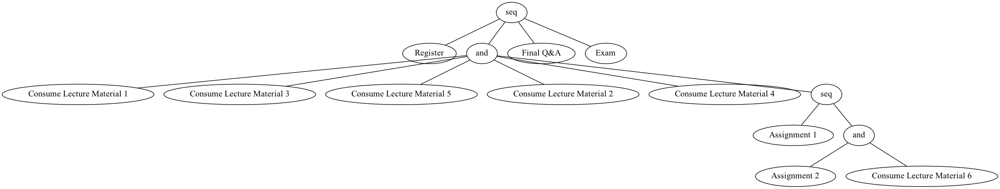

In [119]:
proc_tree8 = pm4py.discover_process_tree_inductive(log_exam, noise_threshold=0.2)
gviz8 = pt_visualizer.apply(proc_tree8, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
pt_visualizer.view(gviz8)

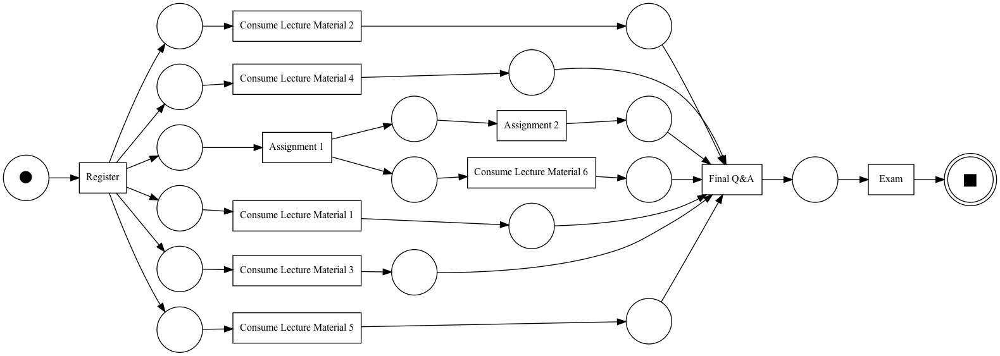

In [120]:
net8, im8, fm8 = pt_converter.apply(proc_tree8)
pm4py.view_petri_net(net8, im8, fm8, format='png') 

In [121]:
fitness8 = replay_fitness_evaluator.apply(log_exam, net8, im8, fm8, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
display(fitness8)

replaying log with TBR, completed variants :: 100%|██████████| 397/397 [00:00<00:00, 2513.23it/s]


{'perc_fit_traces': 77.51677852348993,
 'average_trace_fitness': 0.9420329422692011,
 'log_fitness': 0.9557918485072727,
 'percentage_of_fitting_traces': 77.51677852348993}

    We observe that the models fit well in general (5x perfect fitness). Obviously, the fitness decreases when the noise parameter is introduced because then the inductive miner can ignore some behaviour and thus not necessarily every trace fits. We see that the average trace fitness gets no lower than 90%, this means that each trace fits at least to 90% to some trace discovered by the inductive miner. In the case of non-perfect fitness, we see that the percentage of fitting traces is approximately between 70% and 80%, this means that at least 70%-80% of traces get perfectly explained by the model.
    Log base and log_variant05 don't differ too much on the behaviour they allow in the sense that the petri nets of both models allow to consume the lecture material in no particular order. But we see a big difference in behaviour of log_variant05 and log_variant03. The petri net in log_variant03 is very sequentially ordered, this means that in the most frequent cases the lecture material is consumed in in the recommended order. Thus, while only focusing on 50% of most frequent cases there is already so much variance that we can't detect a clear ordering. This is due to the fact that learning is very individual and we therefore expect much variance.
    The difference that strikes the most between the behaviour of log base and log exam that students who took the exam generally consumed all the lecture materials whereas this behaviour could not be detected in the base log.
    

### Paths of Excellence

**g)** As lectures are in a constant urge to improve their courses in a way that participants learn as much as possible ;), you are facing the research question to identify *paths of excellence*.
In particular, you should identify how the studying behavior differs between excellent students (**final exam score greater than or equal to 85**) and non-excellent students (**final exam score less than 85**).
Try to answer this research questions using techniques from the preceding Process Mining questions. 

*Hint: There is no single unique solution (e.g., in terms of parameter choice); therefore, it suffices if your "design choices" are reasonble.* \
*Hint: The final exam score is point score that is associated with the "Exam" event.*


log: log_excellence


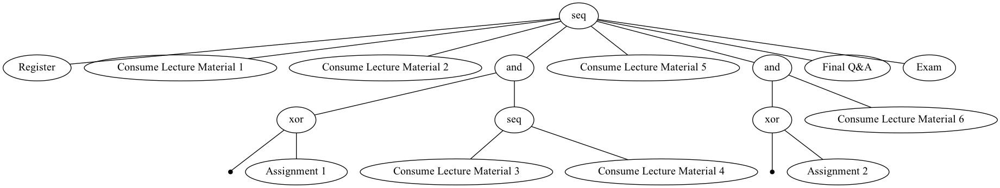

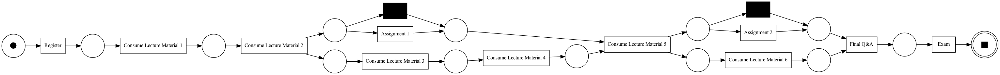

log: log_non_excellence


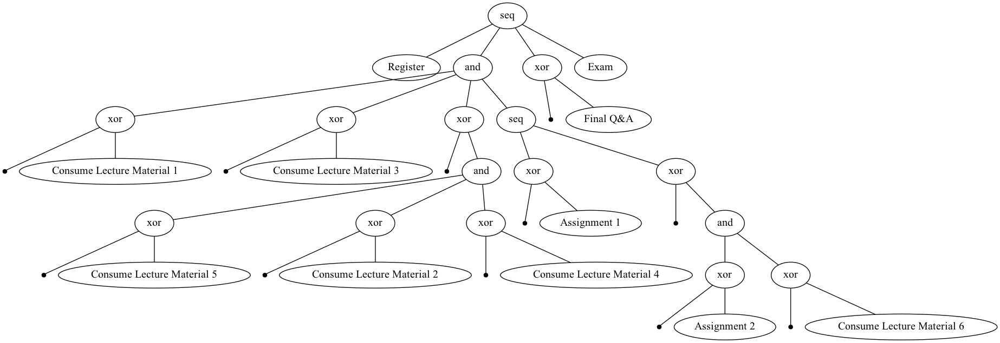

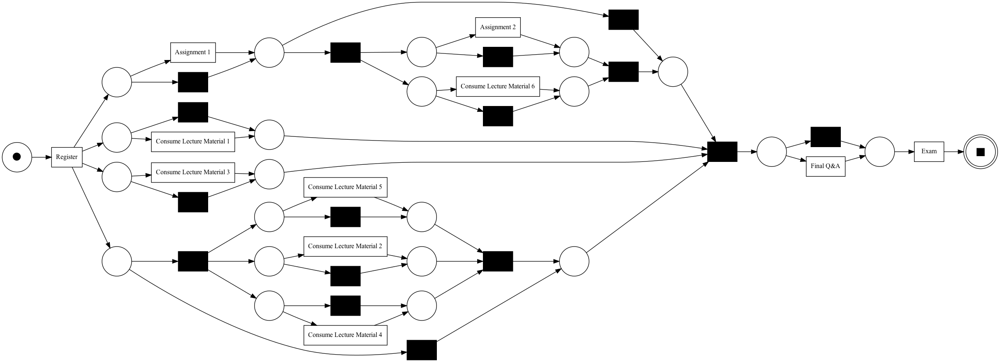

1276


In [122]:
#import
from pm4py.visualization.dfg import visualizer as dfg_visualization
from pm4py.objects.petri_net.obj import PetriNet, Marking
#perform filtering based on exam results
log_excellence = attributes_filter.apply_numeric(log_exam, 85, 100,
                                             parameters={attributes_filter.Parameters.ATTRIBUTE_KEY: "Points",
                                                         attributes_filter.Parameters.STREAM_FILTER_KEY1: "concept:name",
                                                         attributes_filter.Parameters.STREAM_FILTER_VALUE1: "Exam"})

log_non_excellence = attributes_filter.apply_numeric(log_exam, 0, 84,
                                             parameters={attributes_filter.Parameters.ATTRIBUTE_KEY: "Points",
                                                         attributes_filter.Parameters.STREAM_FILTER_KEY1: "concept:name",
                                                         attributes_filter.Parameters.STREAM_FILTER_VALUE1: "Exam"})
for item in [('log_excellence', log_excellence), ('log_non_excellence', log_non_excellence)]:
    print('log: ' + item[0])
    proc_tree = pm4py.discover_process_tree_inductive(item[1], noise_threshold=0)
    gviztree = pt_visualizer.apply(proc_tree, parameters={pt_visualizer.Variants.WO_DECORATION.value.Parameters.FORMAT: "png"})
    net, im, fm = pt_converter.apply(proc_tree)
    parameters = {pn_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "png"}
    pt_visualizer.view(gviztree)
    pm4py.view_petri_net(net, im, fm, format='png')
    

print(len(log_non_excellence))

    One big difference is the consumption of lecture materials. We see that excellent students consume all lecture material and additionally they do so in order, lectures don't get skipped. In general, non-excellent students don't consume all material and even if they do, not always in the right order. We observe that the petri net for excellent students is way more structured and compact. This hints at the fact that the learning approaches of excellent students are rather similar.
    Additionally, we conjecture that excellent student spend more time on lecture material. We will investigate this below.

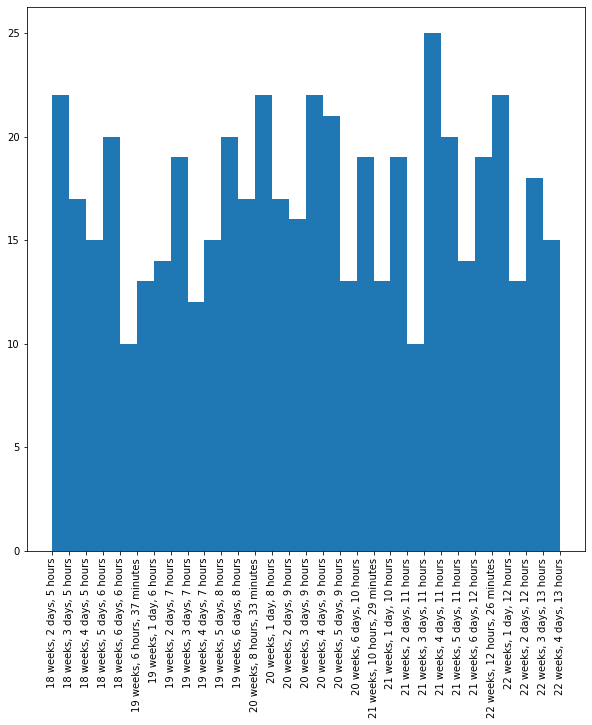

In [123]:
all_case_durations_excellence = case_statistics.get_all_case_durations(log_excellence, parameters={
    case_statistics.Parameters.TIMESTAMP_KEY: "time:timestamp"})



plt.figure(figsize=(10,10))
hist=plt.hist(all_case_durations_excellence,bins=30)
ticks=[display_time(i) for i in hist[1]]

plt.xticks(hist[1],ticks,rotation=90)
hist;

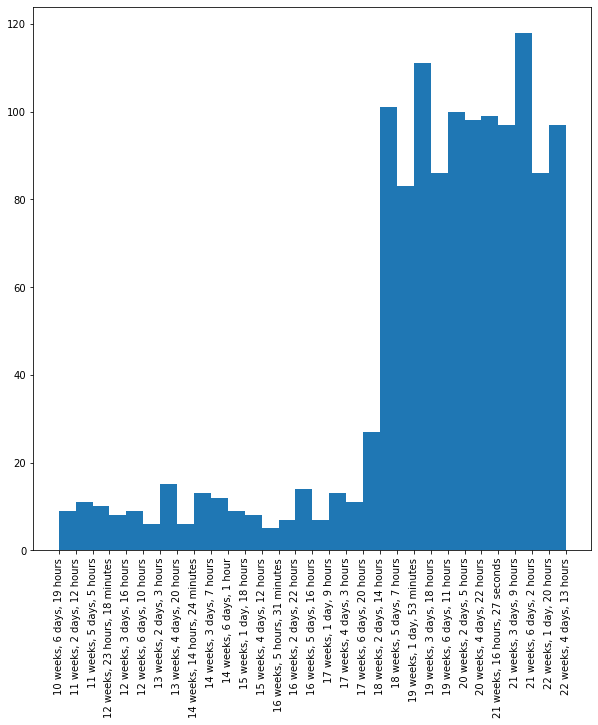

In [124]:
all_case_durations_non_excellence = case_statistics.get_all_case_durations(log_non_excellence, parameters={
    case_statistics.Parameters.TIMESTAMP_KEY: "time:timestamp"})



plt.figure(figsize=(10,10))
hist=plt.hist(all_case_durations_non_excellence,bins=30)
ticks=[display_time(i) for i in hist[1]]

plt.xticks(hist[1],ticks,rotation=90)
hist;

    We see that our intuition was correct. We observe that some of the non-excellent students spend notably less time on the course. In general, excellent students start working early in the semester and don't wait until the last minute.

## Performance and Frequency Decoration

**h)** While the discovery of a process model is the most prototypical step in a process mining analysis, its enrichment by frequency and performance statistics is a very common step too. To this end, enrich the Petri net that you discovered for log_exam using Inductive Miner with noise threshold 0.2 by frequency and performance information. Plot two Petri nets decorated with frequency and performance information, respectively.

Describe your results. Can you observe any problems (in particular with respect to the initial process description)?

replaying log with TBR, completed variants :: 100%|██████████| 397/397 [00:00<00:00, 2506.20it/s]


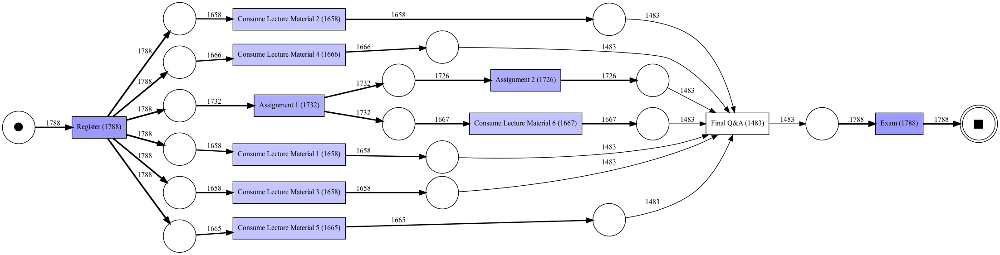

In [125]:
#frequency information
parameters = {pn_visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "png"}
gviz9 = pn_visualizer.apply(net8, im8, fm8, parameters=parameters, variant=pn_visualizer.Variants.FREQUENCY, log=log_exam)
pn_visualizer.view(gviz9)

replaying log with TBR, completed variants :: 100%|██████████| 397/397 [00:00<00:00, 2463.04it/s]


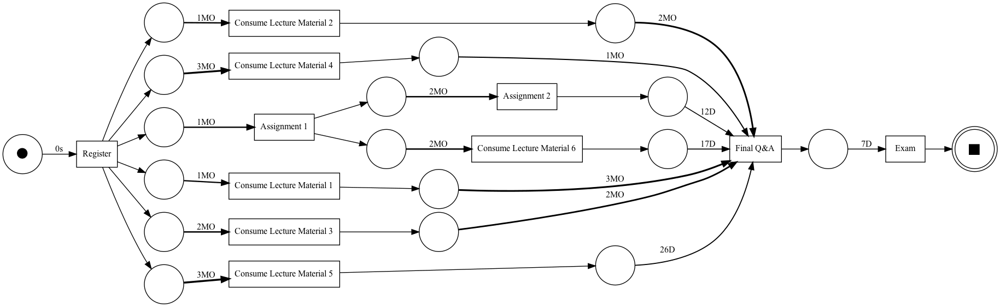

In [126]:
#performance information
gviz10 = pn_visualizer.apply(net8, im8, fm8, parameters=parameters, variant=pn_visualizer.Variants.PERFORMANCE, log=log_exam)
pn_visualizer.view(gviz10)

    We see from the frequency decoration that not everyone who does the exam, has consumed all lecture material. From this alone, it is unclear if there are some people who didn't consume any lecture material or if some people skipped Lecture 1 and other people skipped rather Lecture 3 for instance.
    The performance visualization gives us temporal information. This allows us to conclude, that in general, that the lectures were consumed more or less in order.
    We would also like to draw attention to the placement of lecture 6 in the petri net. The visualization could mislead us into thinking that one has to do Assignment 1 first before consuming Lecture 6.

## Process Mining Meets Advanced Visualization

### Studying Activity Heatmap

**a)** In this task, we are going to use advanced visualization techniques to create an overview over the course acitivities over time (**log.csv**).
In particular, you shall create a heatmap that shows how often activities occur in a particular week. 
Your heatmap should adhere to the following specification:
- y-axis: Shows the activity labels
- x-axis: Time in terms of course weeks. See the following example snippet:
<div>
<img src="templates/PMAV_HeatmapXAxisSnippet.png" width="100"/>
</div>
- data: The bucket counts should be derived from **log.csv**

Using this configuration, the bucket 2021-11-24 till 2021-12-01 with y-axis label "Exam" and value v would be read as:
In the week between 2021-11-24 and 2021-12-01 v exams took place.

Describe your result. Which patterns do you observe?

Note: we know that the earlist timestamp is from 2021-09-15

In [127]:
log_heatmap=df.groupby( "concept:name").resample('W-Mon', on='time:timestamp',label='left',closed='left').size().to_frame('size')
log_heatmap=log_heatmap.unstack(level=1,fill_value=0)

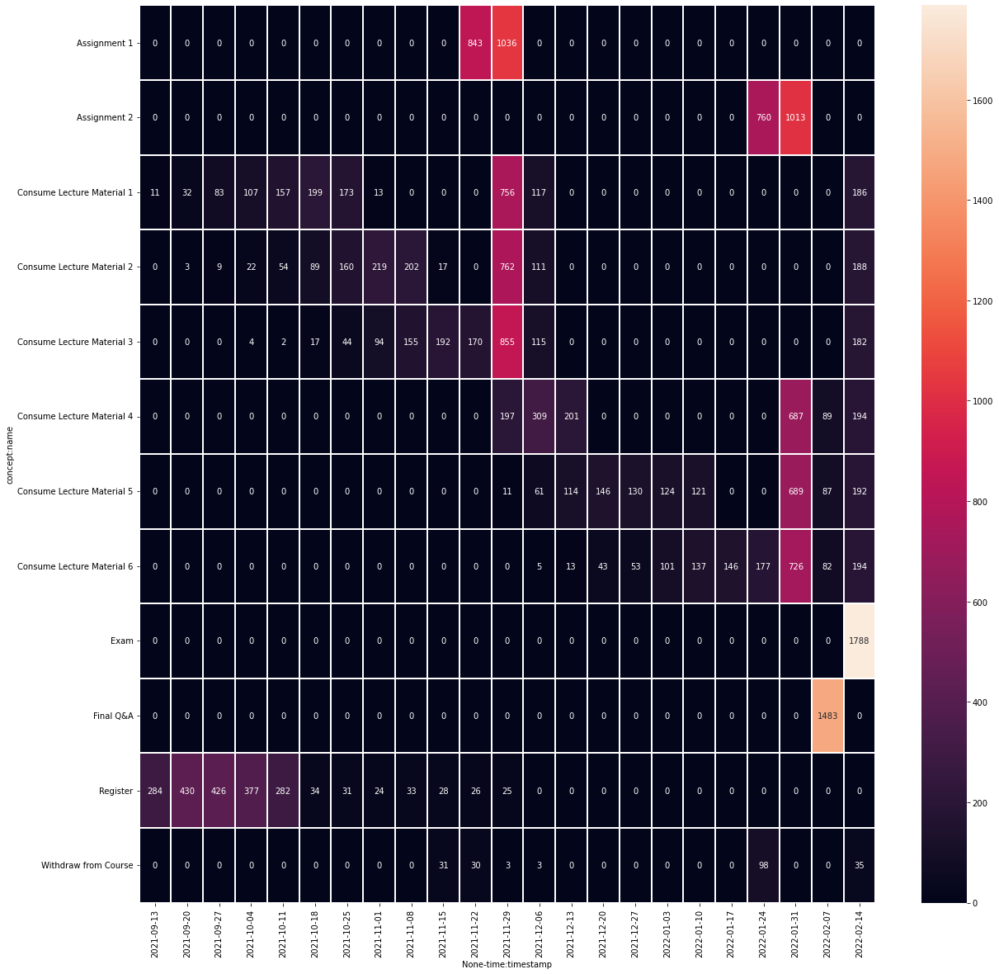

In [128]:
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(log_heatmap, ax=ax,annot=True, fmt="d", linewidths=.2,)
#remove time from date
ticks=[str(i)[20:-27] for i in log_heatmap.keys()]
ax.set_xticklabels(ticks);

    First of all, we notice that in the first few weeks there is a lot of activity in the Register row. This is normal, as students have to register for a course at the start of the semester.
    Secondly we notice a slight diagonal pattern for the lecture consumption. This diagonal pattern suggests that lectures are consumed more or less in the suggested order.
    Thirdly, we notice that in the weeks where the assignments are due, the lectures relevant for the respective assignment get consumed a lot.
    Lastly, we observe that a great majority attends to the Final Q&A and we see also slight increase of all lecture consumption in the week of the exam.

**b)** Can you relate the patterns that you observe in the heatmap to the process models that you discovered in question **Q5 - f)**?

*Hint: In contrast to the other questions, this question is deliberately less explicit. You may approach it having the following question in mind: \
Is there a pattern in the heatmap that explains why a certain process model shows a certain behavior/control flow?*

    We mentioned a diagonal pattern. This pattern could be explained by the excellent students who consume the lectures more sequentially. 
    The peak of consumption of relevant lecture material when an assignment is due is likely explained by students who only start consuming lectures when they have to. Most of them fall into the non-excellent category. One could argue that this peak is due to the fact that also many students revisit these lectures again but this is only a minority. Because if it were so, the total number of lecture consumption would be higher. Therefore we conclude that these peaks are mostly caused by students who start at the last minute.
    Furthermore, we see that most students work on Assignment 1 and Lecture 3 at the same time. This is something the graphs from Q5-f) didn't show.
    But the heatmap explains why the inductive miner thinks that one has to complete Assignment 1 before consuming lecture 6. There is not a single activity for lecture 6 before the due date of assignment 1. But this is normal, as lecture 6 was most likely published after the due date of assignment 1.

### Process Flow

**c)** Assume that another process analyst also had access to the event log. 
Given the data, he created the following novel entities:
- 'Block 1 Complete': The participant downloaded the entire material of the first lecture block (materials 1, 2, and 3). (Not considering when he downloaded it)
- 'Block 1 Incomplete': The participant did not download the entire material of the first lecture block
- 'Block 2 Complete': See 'Block 1 Complete'
- 'Block 2 Incomplete': See 'Block 1 Incomplete'
- 'Ass 1 Excellent': Participant scored at least 85 points in the first part of the assignment
- 'Ass 1 Not Excellent': Participant scored less than 85 points in the part of the assignment
- 'Ass 2 Not Excellent', 'Ass 2 Excellent', 'Exam Not Excellent', 'Exam Excellent': Similar to 'Ass 1 Excellent' and 'Ass 1 Not Excellent'
- 'Withdraw': Participant dropped the course

Based on the entities he derived a set of flow, for example, the flow between 'Block 1 Complete' and 'Ass 1 Excellent' describes how often a partipant who consumed the first lecture block scored excellent in the first part of the assignment.

The next cell loads the entities and flows for you. The flows are stored as a dictionary following the pattern:

    (source, target): flow_value
    
where source and target are indices into the entities list.

Create a **Sankey diagram** that visulizes these flows. Please use `plotly.graph_object.Sankey` to create the diagram.

Briefly **describe** your results.
Moreover, **discuss** this visualization considering your knowlege from the Process Mining task.

*Hint: Having a look at the Sankey diagram will make the analyst's idea behind the entities much clearer.*

In [129]:
with open('./dataset/sankeyEntities.pkl', 'rb') as f:
    entities = pickle.load(f)
with open('./dataset/sankeyFlows.pkl', 'rb') as f:
    flows = pickle.load(f)

In [130]:
keys=[*flows]
keysasalist=list(map(list, zip(*keys)))


In [131]:
l_source = keysasalist[0]
l_target = keysasalist[1]
l_labels = entities
l_values = list(flows.values())

# Define Sankes diagram
fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = l_labels,
      color = "blue"
    ),
    link = dict(
      source = l_source,
      target = l_target,
      value = l_values
  ))])

fig.update_layout(title_text="Basic Sankey Diagram", font_size=10)
fig.show()

    We observe that almost all excellent students (defined as before i.e. Exam points>85) did also excellent on the assignments. There are some students who weren't excellent on the assignments but excellent on the exam and vice versa. This can be explained by weaker group members who get carried by stronger group members and on the other hand by students who weren't motivated to work during the semester (as the assignments were not necessary for exam admission) but got their act together when it was time to study for the exam.
    The majority of students weren't excellent on the exam and assignments.
    Furthermore we notice that incompletion of a block leads to bad performance on the assignments.
    Many withdrawals occur after bad assignment results. Many withdrew also after completion of the first block. Interestingly there were also two students who did well on the first assignment and then withdrew. 
    Again, the Sankey Diagram suggests that in order to do well on a course, you should consume all your lecture material and do well on the assignments. That is the most promising approach; a result we already deduced from the other process mining tasks.
    

# Question 6 - Big Data (15 points) 

### Problem Description
You are working at a finance company that makes loans to individuals and businesses. As a process analyst in *business intelligence team*, you are expected to deliver data-driven insights to improve business processes of the company. Recently, your boss asked you to discover a comprehensive process model of 10 international branches using your big data skills. Your colleague already tried it using commercial on-premise tools, but, due to the immense size of the data, he didn't manage to even load the data to the tool. You are planning to 1) load the datasets from 10 different branches to Hadoop Distributed File System (HDFS), 2) preprocess them using HDFS, and 3) use MapReduce programming model to discover a comprehensive process model. 

### Preparation
The preparation of this problem consists of two steps:

**Preparation step 1**: Replace the filepath to your own filepath to produce the **LoanApplication.csv**.  

In [132]:
import pandas as pd
filepath = "./dataset/LoanApplication.csv"
original_log = pd.read_csv(filepath,sep=",")
original_log.head(25)

,eventID,CaseID,Activity,Timestamp,LoanGoal,ApplicationType,RequestedAmount,Action,FirstWithdrawalAmount,Accepted,NumberOfTerms,OfferID,org:resource,MonthlyCost,EventOrigin,EventID,Selected,CreditScore,OfferedAmount,Duration
0,661035,Application_1000086665,A_Create Application,18601566,"Other, see explanation",New credit,5000.0,Created,NaN,NaN,NaN,NaN,User_1,NaN,Application,Application_1000086665,NaN,NaN,NaN,0
1,661036,Application_1000086665,A_Submitted,18601566,"Other, see explanation",New credit,5000.0,statechange,NaN,NaN,NaN,NaN,User_1,NaN,Application,ApplState_161925113,NaN,NaN,NaN,0
2,661040,Application_1000086665,A_Concept,18601632,"Other, see explanation",New credit,5000.0,statechange,NaN,NaN,NaN,NaN,User_1,NaN,Application,ApplState_385184570,NaN,NaN,NaN,0
3,661041,Application_1000086665,W_Complete application,18679694,"Other, see explanation",New credit,5000.0,Obtained,NaN,NaN,NaN,NaN,User_14,NaN,Workflow,Workitem_518019192,NaN,NaN,NaN,0
4,661043,Application_1000086665,A_Accepted,18767152,"Other, see explanation",New credit,5000.0,statechange,NaN,NaN,NaN,NaN,User_5,NaN,Application,ApplState_856156982,NaN,NaN,NaN,0
5,661044,Application_1000086665,O_Create Offer,18767322,"Other, see explanation",New credit,5000.0,Created,5000.0,True,22.0,NaN,User_5,241.28,Offer,Offer_410892064,False,0.0,5000.0,0
6,661045,Application_1000086665,O_Created,18767322,"Other, see explanation",New credit,5000.0,statechange,5000.0,True,22.0,Offer_410892064,User_5,241.28,Offer,OfferState_2071773136,False,0.0,5000.0,0
7,661046,Application_1000086665,O_Sent (mail and online),18767407,"Other, see explanation",New credit,5000.0,statechange,5000.0,True,22.0,Offer_410892064,User_5,241.28,Offer,OfferState_388269514,False,0.0,5000.0,0
8,661049,Application_1000086665,W_Call after offers,18767407,"Other, see explanation",New credit,5000.0,Obtained,5000.0,True,22.0,Offer_410892064,User_5,241.28,Workflow,Workitem_409035147,False,0.0,5000.0,0
9,661050,Application_1000086665,A_Complete,18767407,"Other, see explanation",New credit,5000.0,statechange,5000.0,True,22.0,Offer_410892064,User_5,241.28,Application,ApplState_1103800866,False,0.0,5000.0,0


**Preparation step 2**: In this question, we generate 10 event logs based on the ``original_log``. For randomization, you need to use the sum of the group's matriculation numbers (e.g., a group with 3 students having "100000", "100001", and "100002" as their matriculation numbers will use "300003" for the randomization).

In [133]:
# Below are GIVEN utility functions (do not modify):
import random
import os
def _ramdomize(x):
    random_val = random.randint(5,10)
    return x+random_val

def _randomize_log(log,matriculation_num):
    """Randomize case attributes based on the matriculation number

    Keyword arguments:
    log -- event log
    matriculation_num - sum of matriculation numbers
    """
    attribute_cols = ["Duration"]
    random.seed(matriculation_num)
    for attr in attribute_cols:
        log[attr] = log[attr].apply(_ramdomize)
    return log

def _extract_log(log,iter_num):
    """Extract n-th log to ./generated_logs/

    Keyword arguments:
    log -- event log
    iter_num -- n-th iteration
    """
    log.to_csv("./generated_logs/generated_log-{}.tsv".format(iter_num),header=False,index=False, sep="\t",line_terminator="")

def generate_log(original_log,num_replication,mat_num):
    """Generate logs (randomized by the matriculation number and extracted to ./generated_logs/) 

    Keyword arguments:
    log -- event log
    num_replication -- number of generated logs
    mat_num -- sum of matriculation numbers
    """
    case_col="CaseID"
    timestamp_col = "Timestamp"
    dir_path = "./generated_logs"
    try:
        os.mkdir(dir_path)
    except OSError:
        print ("Directory already exists: %s" % dir_path)
    else:
        print ("Successfully created the directory %s " % dir_path)
    
    for i in range(num_replication):
        print("starts {}".format(i))
        generated_log = original_log.copy(deep=True)
        generated_log[case_col] = str(i) + generated_log[case_col]
        generated_log[timestamp_col] = generated_log[timestamp_col].apply(str).str.zfill(10)
        randomized_log = _randomize_log(generated_log,mat_num)
        _extract_log(randomized_log,i)
        print ("Successfully created %i th log at %s "% (i,dir_path))

Replace the SUM_MAT_NUM to yours to generate logs.

In [134]:
# your code
SUM_MAT_NUM = 383400+377818
NUM_REPITITION=10
generate_log(original_log,NUM_REPITITION,SUM_MAT_NUM)

Directory already exists: ./generated_logs
starts 0
Successfully created 0 th log at ./generated_logs 
starts 1
Successfully created 1 th log at ./generated_logs 
starts 2
Successfully created 2 th log at ./generated_logs 
starts 3
Successfully created 3 th log at ./generated_logs 
starts 4
Successfully created 4 th log at ./generated_logs 
starts 5
Successfully created 5 th log at ./generated_logs 
starts 6
Successfully created 6 th log at ./generated_logs 
starts 7
Successfully created 7 th log at ./generated_logs 
starts 8
Successfully created 8 th log at ./generated_logs 
starts 9
Successfully created 9 th log at ./generated_logs 


### 6.1. Hadoop Distributed File System (HDFS)

Now, it's time to work with the Hadoop Distributed File System (HDFS). The goal of this task is to merge 10 event logs at your disk using HDFS. Follow the instructions below and show your results in each step (screenshots of the command line). We use "letter identifier" for this task (The letter identifier is the string consisting of the first letters of the group memebers' first names, e.g., for the group with "Antonio Rüdiger", "Bernd Leno", "Christian Günter", the indentifier is "ABC").

    1) Import the event logs to your Docker engine (at /usr/local/hadoop/(identifier)-generated-logs/).
    2) Upload the event logs to the running HDFS (at /input/(identifier)-generated-logs/). 
    3) Merge all the files and copy the result back to HDFS (at /input/(identifier)-final-log-10.tsv).
    4) Merge 6 files (you can randomly select) and copy the result back to HDFS (at /input/(identifier)-final-log-6.tsv).
    5) Merge 2 files (you can randomly select) and copy the result back to HDFS (at /input/(identifier)-final-log-2.tsv).
    6) Print out the completely-merged event log from 3), i.e., "(identifier)-final-log-10.tsv", in the command line (the screenshot may contain 10 rows).

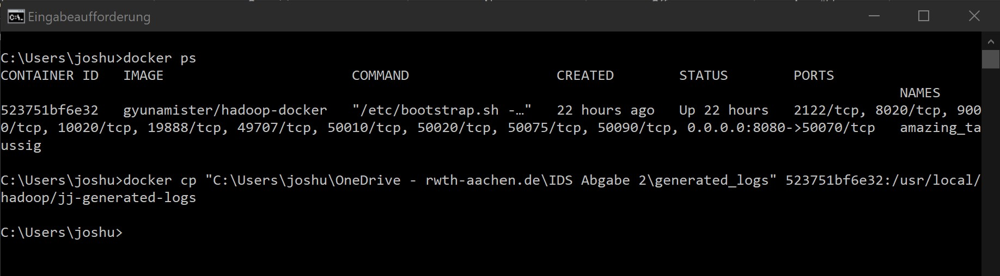

In [135]:
#your code
from IPython.display import Image
Image(filename='./Screenshots/a1.jpg')

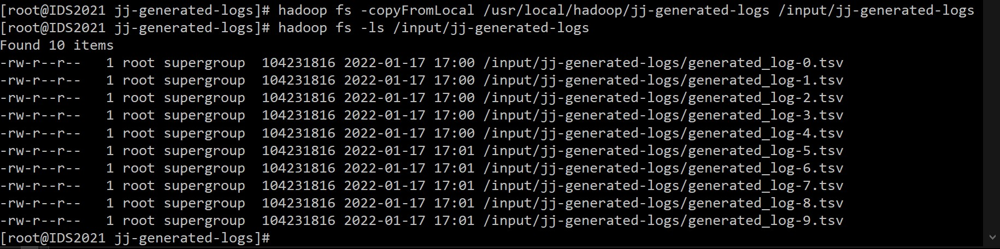

In [136]:
Image(filename='./Screenshots/a2.jpg')

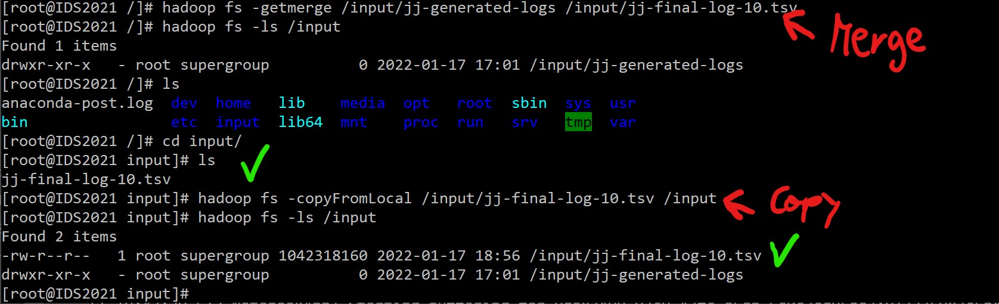

In [137]:
Image(filename='./Screenshots/a3.jpg')

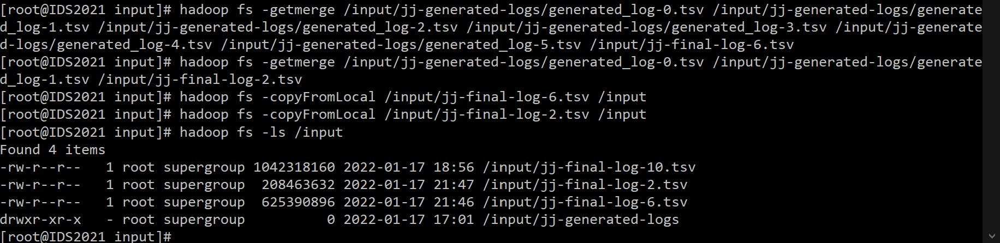

In [138]:
#we did task 4) and 5) here
Image(filename='./Screenshots/a4.jpg')

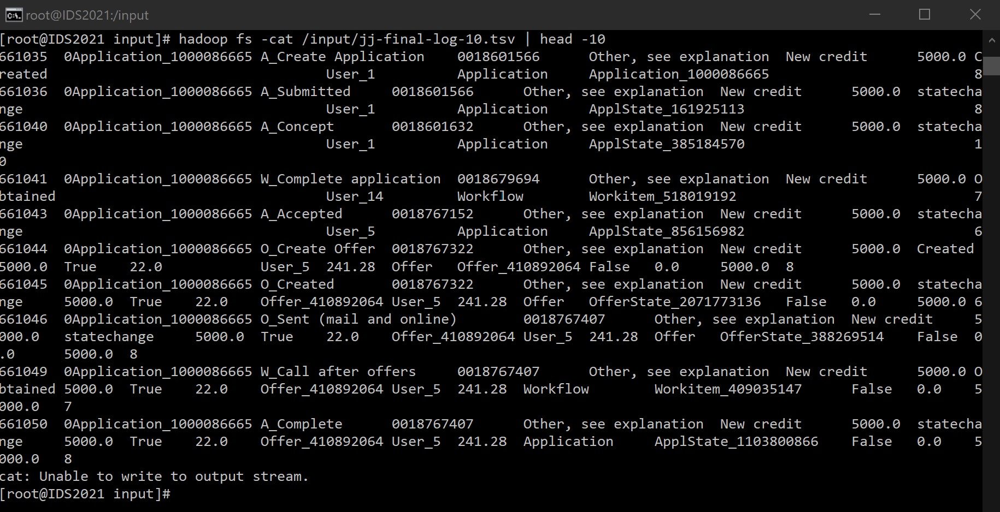

In [139]:
Image(filename='./Screenshots/a5.jpg')

### 6.2. Process Discovery

Discover a process model from the completely merged event log using MapReduce algorithms. Explain how you discover the process model with the following deliverables:

    1) Mapper function (as python file(s))
    2) Reducer function (as python file(s))
    3) Hadoop commands for MapReduce computation (as text file)
    4) Jupyter notebook script that visualize (1) a directly-follows graph and (2) a Petri net  based on the computed directly-follows relations.

<font color='red'>Important!</font> Please note that in this task, your result will be evaluated based on whether they are reproducible from your explanation. If you skip MapReduce computations for this task, you will get 0 points.The deliverables of 1), 2), and 3) should be submitted as outputs. 

    *Explanation*: In order to be able to use our process mining tools on such large datasets, we have to convert our data into a directly-follows-graph. These can be stored much more efficiently.
    *mapper1*: The first mapper function takes the jj-final-log.tsv file as input. For each line it removes whitespaces and splits the rows into values so that we can access each value via an index. We then assign the caseID to the value with index 1, the activity to the value with index 2 and the timestamp to the value with index 3. Afterwards we print the results in the format "caseID - timestamp \t activity ".
    *reducer1*: The first reducer function takes the output from the first mapper function as input. It then parses the input in a similar way to mapper1. Afterwards it generates the traces and writes the results to STDOUT in the format "caseID \t [activity]" where [activity] is a trace represented as a list of activities.
    *mapper2*: The second mapper function takes the output from the first reducer function as input. It then splits each line again and iterates through the activity list. Afterwards it determines all of the directly-follows relations and prints them in the format "activity1 , activity2 \t 1". The 1 is important as it is used to count the occurence of each directly-follows relation in the following reducer step.
    *reducer2*: The second reducer function takes the output from the second mapper function as input. It then parses the input again and counts how often each directly-follows relation occurs. The output consists of each unique relation with its corresponding count.
    

In [140]:
import os
import csv
from pm4py.objects.log.importer.xes import importer as xes_importer
from pm4py.objects.conversion.dfg import converter as dfg_mining
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualization
from pm4py.visualization.petri_net import visualizer as pn_visualizer

In [141]:
# import the map reduced data
with open('output/mapreduced.tsv') as file: 
    file_reader = csv.reader(file, delimiter='\t') 
    dfg = dict()
    for row in file_reader:
        _from, _to = row[0].split(',') 
        rel = (_from,_to)
        freq = int(row[1])
        dfg[rel] = freq

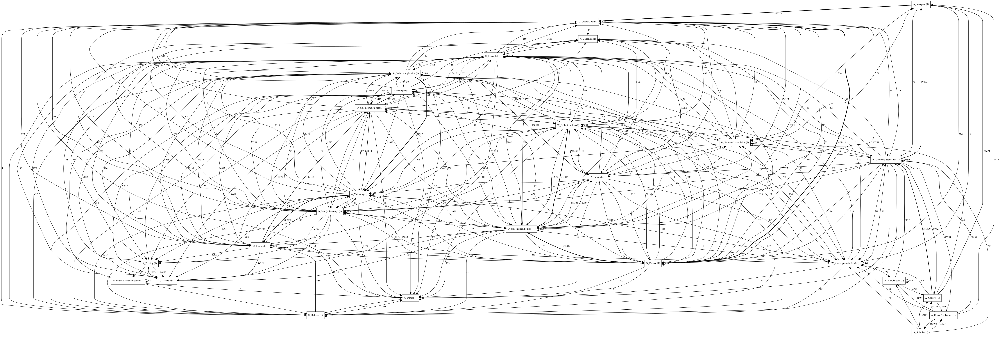

In [142]:
# visualize the direclty-follows relations as directly-follows-graph
gviz = dfg_visualization.apply(dfg)
dfg_visualization.view(gviz)
dfg_visualization.save(gviz, "dfg.png")


In [143]:
net, im, fm = dfg_mining.apply(dfg)
gviz = pn_visualizer.apply(net, im, fm)
pn_visualizer.view(gviz)
dfg_visualization.save(gviz, "pt.png")

### 6.3. Performance Analysis

a) Compute the total service time for each case based on MapReduce algorithms using the completely-merged event log (i.e., (identifier)-final-log-10.tsv) and visualize 100 cases that show the longest total service time using any chart.
    
The deliverables of 1), 2), 3) and 4) should be submitted as outputs:
```
1) Mapper function (as python file(s))
2) Reducer function (as python file(s))
3) Hadoop commands for MapReduce calculation (as text file)
4) Result: total service times for cases (as text file)
```

    Explanation:
    Now our mapper mapper_servicetime does basically the same thing as mapper1.py but now we're only interested in the case id and the duration.
    Reducer_servicetime does more or less the same thing as reducer2.py. He only adds up duration time per case.

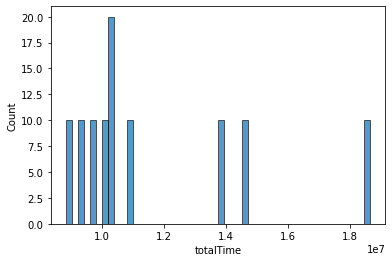

In [144]:
# import generated data
#with -copyToLocal we imported the results back to our local folder
servicetimes_csv = pd.read_csv('output/servicetimefinal.tsv', header = None)
total_times = servicetimes_csv.rename({0: 'caseID', 1: 'totalTime'}, axis='columns')
# sort cases by totalTime
total_times = total_times.sort_values('totalTime', ascending=False)
# select 100 cases with the longest time
total_times = total_times[:100]
# visualize these cases
sns.histplot(total_times.totalTime, bins=50);

b) Compare the (approximate) computation time of the service time calculation between 1. the completely-merged event log (i.e., (identifier)-final-log-10.tsv), 2. 6-merged event log (i.e., (identifier)-final-log-6.tsv), and 3. 2-merged event log (i.e., (identifier)-final-log-2.tsv). Interpret the difference (e.g., the computation time scales linearly with the increasing number of events).

final-log-10:
real    1m11.874s
user    1m33.897s
sys     0m14.754s
final-log-6:
real    1m38.574s
user    1m36.573s
sys     0m15.045s
final-log-2:
real    1m20.744s
user    1m37.712s
sys     0m12.959s



    We measured the time with the time command which measures wall-clock time. Surprisingly we see that the computational time doesn't increase linearly. This made us really curious and we had a look at our input file to see if the merging operation had gone wrong but the input sizes made sense (their size was relative to the relation of 2,6 and 10 to each other), so we think that this isn't the problem. Theoretically we would expect a linear scaling in computation time but we couldn't observe it.